https://github.com/zackchase/mxnet-the-straight-dope/blob/master/chapter14_generative-adversarial-networks/pixel2pixel.ipynb
一开始import失败了

In [2]:
!pip install -U mxnet-cu101==1.7.0

     |███████████████████████████████▌| 834.1MB 1.2MB/s eta 0:00:10tcmalloc: large alloc 1147494400 bytes == 0x64fac000 @  0x7fb7126ac615 0x591e47 0x4cc179 0x4cc2db 0x50a1cc 0x50beb4 0x507be4 0x509900 0x50a2fd 0x50beb4 0x507be4 0x509900 0x50a2fd 0x50cc96 0x58e683 0x50c127 0x58e683 0x50c127 0x58e683 0x50c127 0x58e683 0x50c127 0x5095c8 0x50a2fd 0x50beb4 0x507be4 0x509900 0x50a2fd 0x50beb4 0x5095c8 0x50a2fd
     |████████████████████████████████| 846.0MB 21kB/s 
  Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1


In [3]:
from __future__ import print_function
import os
import matplotlib as mpl
import tarfile
import matplotlib.image as mpimg
from matplotlib import pyplot as plt

import mxnet as mx
from mxnet import gluon
from mxnet import ndarray as nd
from mxnet.gluon import nn, utils
from mxnet.gluon.nn import Dense, Activation, Conv2D, Conv2DTranspose, \
    BatchNorm, LeakyReLU, Flatten, HybridSequential, HybridBlock, Dropout
from mxnet import autograd
import numpy as np

In [4]:
epochs = 100
batch_size = 10

use_gpu = True
ctx = mx.gpu() if use_gpu else mx.cpu()

lr = 0.0002
beta1 = 0.5
lambda1 = 100

pool_size = 50

In [5]:
dataset = 'facades'

In [6]:
img_wd = 256
img_ht = 256
train_img_path = '%s/train' % (dataset)
val_img_path = '%s/val' % (dataset)

In [7]:
def download_data(dataset):
    if not os.path.exists(dataset):
        url = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/%s.tar.gz' % (dataset)
        os.mkdir(dataset)
        data_file = utils.download(url)
        with tarfile.open(data_file) as tar:
            tar.extractall(path='.')
        os.remove(data_file)

In [8]:
download_data(dataset)

In [9]:
def load_data(path, batch_size, is_reversed=False):
    img_in_list = []
    img_out_list = []
    for path, _, fnames in os.walk(path):
        for fname in fnames:
            if not fname.endswith('.jpg'):
                continue
            img = os.path.join(path, fname)
            img_arr = mx.image.imread(img).astype(np.float32)/127.5 - 1
            img_arr = mx.image.imresize(img_arr, img_wd * 2, img_ht)
            # Crop input and output images
            img_arr_in, img_arr_out = [mx.image.fixed_crop(img_arr, 0, 0, img_wd, img_ht),
                                       mx.image.fixed_crop(img_arr, img_wd, 0, img_wd, img_ht)]
            img_arr_in, img_arr_out = [nd.transpose(img_arr_in, (2,0,1)), 
                                       nd.transpose(img_arr_out, (2,0,1))]
            img_arr_in, img_arr_out = [img_arr_in.reshape((1,) + img_arr_in.shape), 
                                       img_arr_out.reshape((1,) + img_arr_out.shape)]
            img_in_list.append(img_arr_out if is_reversed else img_arr_in)
            img_out_list.append(img_arr_in if is_reversed else img_arr_out)

    return mx.io.NDArrayIter(data=[nd.concat(*img_in_list, dim=0), nd.concat(*img_out_list, dim=0)], 
                             batch_size=batch_size)

In [10]:
train_data = load_data(train_img_path, batch_size, is_reversed=True)
val_data = load_data(val_img_path, batch_size, is_reversed=True)

In [11]:
def visualize(img_arr):
    plt.imshow(((img_arr.asnumpy().transpose(1, 2, 0) + 1.0) * 127.5).astype(np.uint8))
    plt.axis('off')

In [12]:
def preview_train_data():
    img_in_list, img_out_list = train_data.next().data
    for i in range(4):
        plt.subplot(2,4,i+1)
        visualize(img_in_list[i])
        plt.subplot(2,4,i+5)
        visualize(img_out_list[i])
    plt.show()

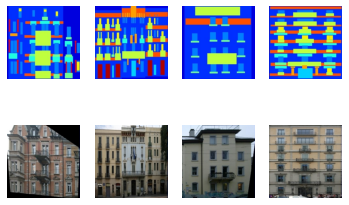

In [13]:
preview_train_data()

In [14]:
# Define Unet generator skip block
class UnetSkipUnit(HybridBlock):
    def __init__(self, inner_channels, outer_channels, inner_block=None, innermost=False, outermost=False,
                 use_dropout=False, use_bias=False):
        super(UnetSkipUnit, self).__init__()
        
        with self.name_scope():
            self.outermost = outermost
            en_conv = Conv2D(channels=inner_channels, kernel_size=4, strides=2, padding=1,
                             in_channels=outer_channels, use_bias=use_bias)
            en_relu = LeakyReLU(alpha=0.2)
            en_norm = BatchNorm(momentum=0.1, in_channels=inner_channels)
            de_relu = Activation(activation='relu')
            de_norm = BatchNorm(momentum=0.1, in_channels=outer_channels)

            if innermost:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels, use_bias=use_bias)
                encoder = [en_relu, en_conv]
                decoder = [de_relu, de_conv, de_norm]
                model = encoder + decoder
            elif outermost:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels * 2)
                encoder = [en_conv]
                decoder = [de_relu, de_conv, Activation(activation='tanh')]
                model = encoder + [inner_block] + decoder
            else:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels * 2, use_bias=use_bias)
                encoder = [en_relu, en_conv, en_norm]
                decoder = [de_relu, de_conv, de_norm]
                model = encoder + [inner_block] + decoder
            if use_dropout:
                model += [Dropout(rate=0.5)]
        
            self.model = HybridSequential()
            with self.model.name_scope():
                for block in model:
                    self.model.add(block)

    def hybrid_forward(self, F, x):
        if self.outermost:
            return self.model(x)
        else:
            return F.concat(self.model(x), x, dim=1)


In [15]:
# Define Unet generator
class UnetGenerator(HybridBlock):
    def __init__(self, in_channels, num_downs, ngf=64, use_dropout=True):
        super(UnetGenerator, self).__init__()

        #Build unet generator structure
        unet = UnetSkipUnit(ngf * 8, ngf * 8, innermost=True)
        for _ in range(num_downs - 5):
            unet = UnetSkipUnit(ngf * 8, ngf * 8, unet, use_dropout=use_dropout)
        unet = UnetSkipUnit(ngf * 8, ngf * 4, unet)
        unet = UnetSkipUnit(ngf * 4, ngf * 2, unet)
        unet = UnetSkipUnit(ngf * 2, ngf * 1, unet)
        unet = UnetSkipUnit(ngf, in_channels, unet, outermost=True)

        with self.name_scope():
            self.model = unet

    def hybrid_forward(self, F, x):
        return self.model(x)

In [16]:
# Define the PatchGAN discriminator
class Discriminator(HybridBlock):
    def __init__(self, in_channels, ndf=64, n_layers=3, use_sigmoid=False, use_bias=False):
        super(Discriminator, self).__init__()
        
        with self.name_scope():
            self.model = HybridSequential()
            kernel_size = 4
            padding = int(np.ceil((kernel_size - 1)/2))
            self.model.add(Conv2D(channels=ndf, kernel_size=kernel_size, strides=2,
                                  padding=padding, in_channels=in_channels))
            self.model.add(LeakyReLU(alpha=0.2))

            nf_mult = 1
            for n in range(1, n_layers):
                nf_mult_prev = nf_mult
                nf_mult = min(2 ** n, 8)
                self.model.add(Conv2D(channels=ndf * nf_mult, kernel_size=kernel_size, strides=2,
                                      padding=padding, in_channels=ndf * nf_mult_prev,
                                      use_bias=use_bias))
                self.model.add(BatchNorm(momentum=0.1, in_channels=ndf * nf_mult))
                self.model.add(LeakyReLU(alpha=0.2))

            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n_layers, 8)
            self.model.add(Conv2D(channels=ndf * nf_mult, kernel_size=kernel_size, strides=1,
                                  padding=padding, in_channels=ndf * nf_mult_prev,
                                  use_bias=use_bias))
            self.model.add(BatchNorm(momentum=0.1, in_channels=ndf * nf_mult))
            self.model.add(LeakyReLU(alpha=0.2))
            self.model.add(Conv2D(channels=1, kernel_size=kernel_size, strides=1,
                                  padding=padding, in_channels=ndf * nf_mult))
            if use_sigmoid:
                self.model.add(Activation(activation='sigmoid'))

    def hybrid_forward(self, F, x):
        out = self.model(x)
        #print(out)
        return out

In [17]:
def param_init(param):
    if param.name.find('conv') != -1:
        if param.name.find('weight') != -1:
            param.initialize(init=mx.init.Normal(0.02), ctx=ctx)
        else:
            param.initialize(init=mx.init.Zero(), ctx=ctx)
    elif param.name.find('batchnorm') != -1:
        param.initialize(init=mx.init.Zero(), ctx=ctx)
        # Initialize gamma from normal distribution with mean 1 and std 0.02
        if param.name.find('gamma') != -1:
            param.set_data(nd.random_normal(1, 0.02, param.data().shape))

In [18]:
def network_init(net):
    for param in net.collect_params().values():
        param_init(param)

In [19]:
def set_network():
    # Pixel2pixel networks
    netG = UnetGenerator(in_channels=3, num_downs=8)
    netD = Discriminator(in_channels=6)

    # Initialize parameters
    network_init(netG)
    network_init(netD)

    # trainer for the generator and the discriminator
    trainerG = gluon.Trainer(netG.collect_params(), 'adam', {'learning_rate': lr, 'beta1': beta1})
    trainerD = gluon.Trainer(netD.collect_params(), 'adam', {'learning_rate': lr, 'beta1': beta1})
    
    return netG, netD, trainerG, trainerD

In [20]:
# Loss
GAN_loss = gluon.loss.SigmoidBinaryCrossEntropyLoss()
L1_loss = gluon.loss.L1Loss()

In [21]:
netG, netD, trainerG, trainerD = set_network()

In [22]:
class ImagePool():
    def __init__(self, pool_size):
        self.pool_size = pool_size
        if self.pool_size > 0:
            self.num_imgs = 0
            self.images = []

    def query(self, images):
        if self.pool_size == 0:
            return images
        ret_imgs = []
        for i in range(images.shape[0]):
            image = nd.expand_dims(images[i], axis=0)
            if self.num_imgs < self.pool_size:
                self.num_imgs = self.num_imgs + 1
                self.images.append(image)
                ret_imgs.append(image)
            else:
                p = nd.random_uniform(0, 1, shape=(1,)).asscalar()
                if p > 0.5:
                    random_id = nd.random_uniform(0, self.pool_size - 1, shape=(1,)).astype(np.uint8).asscalar()
                    tmp = self.images[random_id].copy()
                    self.images[random_id] = image
                    ret_imgs.append(tmp)
                else:
                    ret_imgs.append(image)
        ret_imgs = nd.concat(*ret_imgs, dim=0)
        return ret_imgs

In [23]:
def facc(label, pred):
        pred = pred.ravel()
        label = label.ravel()
        return ((pred > 0.5) == label).mean()

In [24]:
from datetime import datetime
import time
import logging

def train():
    image_pool = ImagePool(pool_size)
    metric = mx.metric.CustomMetric(facc)

    stamp =  datetime.now().strftime('%Y_%m_%d-%H_%M')
    logging.basicConfig(level=logging.DEBUG)

    for epoch in range(epochs):
        tic = time.time()
        btic = time.time()
        train_data.reset()
        iter = 0
        for batch in train_data:
            ############################
            # (1) Update D network: maximize log(D(x, y)) + log(1 - D(x, G(x, z)))
            ###########################
            real_in = batch.data[0].as_in_context(ctx)
            real_out = batch.data[1].as_in_context(ctx)

            fake_out = netG(real_in)
            fake_concat = image_pool.query(nd.concat(real_in, fake_out, dim=1))
            with autograd.record():
                # Train with fake image
                # Use image pooling to utilize history images
                output = netD(fake_concat)
                fake_label = nd.zeros(output.shape, ctx=ctx)
                errD_fake = GAN_loss(output, fake_label)
                metric.update([fake_label,], [output,])
            
                # Train with real image
                real_concat = nd.concat(real_in, real_out, dim=1)
                output = netD(real_concat)
                real_label = nd.ones(output.shape, ctx=ctx)
                errD_real = GAN_loss(output, real_label)
                errD = (errD_real + errD_fake) * 0.5
                errD.backward()
                metric.update([real_label,], [output,])

            trainerD.step(batch.data[0].shape[0])

            ############################
            # (2) Update G network: maximize log(D(x, G(x, z))) - lambda1 * L1(y, G(x, z))
            ###########################
            with autograd.record():
                fake_out = netG(real_in)
                fake_concat = nd.concat(real_in, fake_out, dim=1)
                output = netD(fake_concat)
                real_label = nd.ones(output.shape, ctx=ctx)
                errG = GAN_loss(output, real_label) + L1_loss(real_out, fake_out) * lambda1
                errG.backward()

            trainerG.step(batch.data[0].shape[0])

            # Print log infomation every ten batches
            if iter % 10 == 0:
                name, acc = metric.get()
                logging.info('speed: {} samples/s'.format(batch_size / (time.time() - btic)))
                logging.info('discriminator loss = %f, generator loss = %f, binary training acc = %f at iter %d epoch %d' 
                         %(nd.mean(errD).asscalar(), 
                           nd.mean(errG).asscalar(), acc, iter, epoch))
            iter = iter + 1
            btic = time.time()

        name, acc = metric.get()
        metric.reset()
        logging.info('\nbinary training acc at epoch %d: %s=%f' % (epoch, name, acc))
        logging.info('time: %f' % (time.time() - tic))

        # Visualize one generated image for each epoch
        fake_img = fake_out[0]
        visualize(fake_img)
        plt.show()


INFO:root:speed: 4.652551990496792 samples/s
INFO:root:discriminator loss = 0.864210, generator loss = 40.373993, binary training acc = 0.496245 at iter 0 epoch 0
INFO:root:speed: 28.89853175232019 samples/s
INFO:root:discriminator loss = 0.691282, generator loss = 40.407104, binary training acc = 0.525377 at iter 10 epoch 0
INFO:root:speed: 27.30046363163578 samples/s
INFO:root:discriminator loss = 0.764919, generator loss = 34.453026, binary training acc = 0.548783 at iter 20 epoch 0
INFO:root:speed: 27.645012097935606 samples/s
INFO:root:discriminator loss = 0.555181, generator loss = 41.667225, binary training acc = 0.574323 at iter 30 epoch 0
INFO:root:
binary training acc at epoch 0: facc=0.601901
INFO:root:time: 16.177611


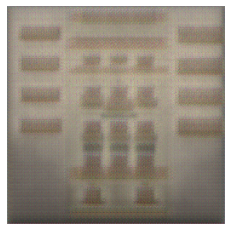

INFO:root:speed: 62.54209057955347 samples/s
INFO:root:discriminator loss = 0.529043, generator loss = 32.752079, binary training acc = 0.669020 at iter 0 epoch 1
INFO:root:speed: 27.521752025595866 samples/s
INFO:root:discriminator loss = 0.415830, generator loss = 37.048122, binary training acc = 0.766653 at iter 10 epoch 1
INFO:root:speed: 27.640621519636337 samples/s
INFO:root:discriminator loss = 0.407180, generator loss = 33.895363, binary training acc = 0.811411 at iter 20 epoch 1
INFO:root:speed: 27.58642825055922 samples/s
INFO:root:discriminator loss = 0.293316, generator loss = 40.507790, binary training acc = 0.832959 at iter 30 epoch 1
INFO:root:
binary training acc at epoch 1: facc=0.838183
INFO:root:time: 14.324176


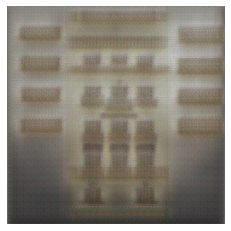

INFO:root:speed: 65.52565923190247 samples/s
INFO:root:discriminator loss = 0.531265, generator loss = 33.115917, binary training acc = 0.702653 at iter 0 epoch 2
INFO:root:speed: 28.25579272503124 samples/s
INFO:root:discriminator loss = 0.295446, generator loss = 36.502235, binary training acc = 0.893777 at iter 10 epoch 2
INFO:root:speed: 27.17656945624235 samples/s
INFO:root:discriminator loss = 0.292921, generator loss = 33.003517, binary training acc = 0.914414 at iter 20 epoch 2
INFO:root:speed: 26.808510094327925 samples/s
INFO:root:discriminator loss = 0.145465, generator loss = 39.483986, binary training acc = 0.932294 at iter 30 epoch 2
INFO:root:
binary training acc at epoch 2: facc=0.907041
INFO:root:time: 14.477996


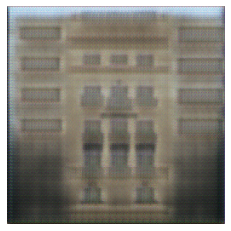

INFO:root:speed: 65.14401623978219 samples/s
INFO:root:discriminator loss = 1.092968, generator loss = 31.037312, binary training acc = 0.611429 at iter 0 epoch 3
INFO:root:speed: 26.273120424147972 samples/s
INFO:root:discriminator loss = 0.303898, generator loss = 35.671867, binary training acc = 0.810308 at iter 10 epoch 3
INFO:root:speed: 26.141693415189007 samples/s
INFO:root:discriminator loss = 0.234867, generator loss = 32.673752, binary training acc = 0.878325 at iter 20 epoch 3
INFO:root:speed: 26.087354583179913 samples/s
INFO:root:discriminator loss = 0.081356, generator loss = 38.849857, binary training acc = 0.887275 at iter 30 epoch 3
INFO:root:
binary training acc at epoch 3: facc=0.897056
INFO:root:time: 14.696861


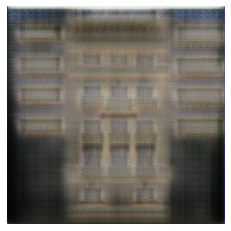

INFO:root:speed: 59.06297481767705 samples/s
INFO:root:discriminator loss = 0.483175, generator loss = 32.666481, binary training acc = 0.792286 at iter 0 epoch 4
INFO:root:speed: 26.153919062168736 samples/s
INFO:root:discriminator loss = 0.136970, generator loss = 36.370060, binary training acc = 0.877377 at iter 10 epoch 4
INFO:root:speed: 26.71682662265568 samples/s
INFO:root:discriminator loss = 0.719708, generator loss = 32.684116, binary training acc = 0.862521 at iter 20 epoch 4
INFO:root:speed: 26.445267182503255 samples/s
INFO:root:discriminator loss = 0.095023, generator loss = 38.533520, binary training acc = 0.884923 at iter 30 epoch 4
INFO:root:
binary training acc at epoch 4: facc=0.890463
INFO:root:time: 14.835598


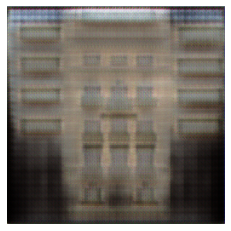

INFO:root:speed: 59.075203452423544 samples/s
INFO:root:discriminator loss = 0.215837, generator loss = 31.030909, binary training acc = 0.952571 at iter 0 epoch 5
INFO:root:speed: 27.010187653748567 samples/s
INFO:root:discriminator loss = 0.549712, generator loss = 33.793991, binary training acc = 0.896519 at iter 10 epoch 5
INFO:root:speed: 25.348173691904826 samples/s
INFO:root:discriminator loss = 0.132321, generator loss = 31.012304, binary training acc = 0.909909 at iter 20 epoch 5
INFO:root:speed: 25.562601589349566 samples/s
INFO:root:discriminator loss = 0.108752, generator loss = 37.174438, binary training acc = 0.922377 at iter 30 epoch 5
INFO:root:
binary training acc at epoch 5: facc=0.922228
INFO:root:time: 15.012594


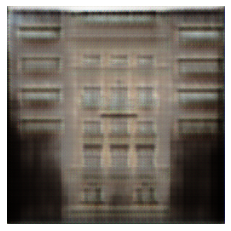

INFO:root:speed: 58.806348494195504 samples/s
INFO:root:discriminator loss = 0.283588, generator loss = 30.056446, binary training acc = 0.888776 at iter 0 epoch 6
INFO:root:speed: 26.084109871193387 samples/s
INFO:root:discriminator loss = 0.354336, generator loss = 33.993027, binary training acc = 0.896794 at iter 10 epoch 6
INFO:root:speed: 25.61300660491656 samples/s
INFO:root:discriminator loss = 0.122349, generator loss = 29.932049, binary training acc = 0.910752 at iter 20 epoch 6
INFO:root:speed: 26.50037214086511 samples/s
INFO:root:discriminator loss = 0.200713, generator loss = 35.801739, binary training acc = 0.919107 at iter 30 epoch 6
INFO:root:
binary training acc at epoch 6: facc=0.899922
INFO:root:time: 15.078393


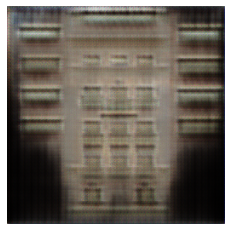

INFO:root:speed: 65.4579618361235 samples/s
INFO:root:discriminator loss = 0.299584, generator loss = 29.289246, binary training acc = 0.918735 at iter 0 epoch 7
INFO:root:speed: 25.971694514759573 samples/s
INFO:root:discriminator loss = 0.126463, generator loss = 33.355125, binary training acc = 0.912171 at iter 10 epoch 7
INFO:root:speed: 25.924002563780846 samples/s
INFO:root:discriminator loss = 0.522563, generator loss = 30.403782, binary training acc = 0.891691 at iter 20 epoch 7
INFO:root:speed: 25.388880548950862 samples/s
INFO:root:discriminator loss = 0.133735, generator loss = 34.146034, binary training acc = 0.917452 at iter 30 epoch 7
INFO:root:
binary training acc at epoch 7: facc=0.883046
INFO:root:time: 15.179479


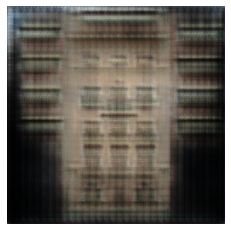

INFO:root:speed: 54.71735330184987 samples/s
INFO:root:discriminator loss = 1.005077, generator loss = 28.358561, binary training acc = 0.645469 at iter 0 epoch 8
INFO:root:speed: 25.417282256823203 samples/s
INFO:root:discriminator loss = 0.269670, generator loss = 31.197128, binary training acc = 0.873091 at iter 10 epoch 8
INFO:root:speed: 25.70751212958491 samples/s
INFO:root:discriminator loss = 0.194286, generator loss = 29.767056, binary training acc = 0.895975 at iter 20 epoch 8
INFO:root:speed: 26.44446686169676 samples/s
INFO:root:discriminator loss = 0.126835, generator loss = 32.545628, binary training acc = 0.911687 at iter 30 epoch 8
INFO:root:
binary training acc at epoch 8: facc=0.875759
INFO:root:time: 15.233245


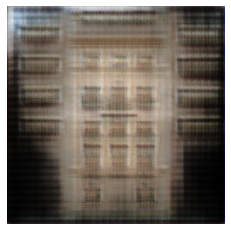

INFO:root:speed: 60.03827627915632 samples/s
INFO:root:discriminator loss = 0.290321, generator loss = 26.968542, binary training acc = 0.888776 at iter 0 epoch 9
INFO:root:speed: 25.021246235004895 samples/s
INFO:root:discriminator loss = 0.128606, generator loss = 30.940527, binary training acc = 0.942731 at iter 10 epoch 9
INFO:root:speed: 25.609925721944236 samples/s
INFO:root:discriminator loss = 0.206135, generator loss = 29.485592, binary training acc = 0.925291 at iter 20 epoch 9
INFO:root:speed: 26.49903273536878 samples/s
INFO:root:discriminator loss = 0.155847, generator loss = 31.637833, binary training acc = 0.914363 at iter 30 epoch 9
INFO:root:
binary training acc at epoch 9: facc=0.917281
INFO:root:time: 15.386822


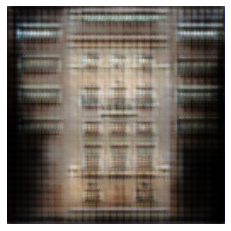

INFO:root:speed: 57.04650027269896 samples/s
INFO:root:discriminator loss = 0.250406, generator loss = 27.934265, binary training acc = 0.926041 at iter 0 epoch 10
INFO:root:speed: 25.097949106436552 samples/s
INFO:root:discriminator loss = 0.214997, generator loss = 28.691364, binary training acc = 0.841310 at iter 10 epoch 10
INFO:root:speed: 25.47580854319185 samples/s
INFO:root:discriminator loss = 0.135096, generator loss = 28.574551, binary training acc = 0.883339 at iter 20 epoch 10
INFO:root:speed: 25.356663319475032 samples/s
INFO:root:discriminator loss = 0.270605, generator loss = 31.248419, binary training acc = 0.891065 at iter 30 epoch 10
INFO:root:
binary training acc at epoch 10: facc=0.890529
INFO:root:time: 15.469713


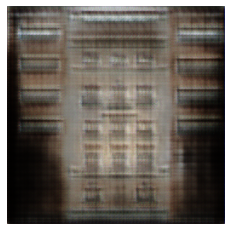

INFO:root:speed: 56.67518849822987 samples/s
INFO:root:discriminator loss = 0.302548, generator loss = 27.800373, binary training acc = 0.905143 at iter 0 epoch 11
INFO:root:speed: 25.515591731454784 samples/s
INFO:root:discriminator loss = 0.360895, generator loss = 29.487682, binary training acc = 0.869377 at iter 10 epoch 11
INFO:root:speed: 24.694121823747146 samples/s
INFO:root:discriminator loss = 0.196569, generator loss = 29.007202, binary training acc = 0.856674 at iter 20 epoch 11
INFO:root:speed: 25.138834946801115 samples/s
INFO:root:discriminator loss = 0.188499, generator loss = 30.751873, binary training acc = 0.882773 at iter 30 epoch 11
INFO:root:
binary training acc at epoch 11: facc=0.870000
INFO:root:time: 15.459171


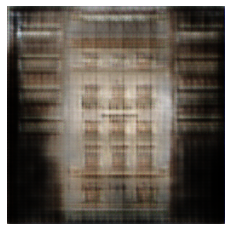

INFO:root:speed: 59.60823995054324 samples/s
INFO:root:discriminator loss = 0.333068, generator loss = 26.491261, binary training acc = 0.908898 at iter 0 epoch 12
INFO:root:speed: 25.23451234259655 samples/s
INFO:root:discriminator loss = 0.146201, generator loss = 27.680134, binary training acc = 0.835614 at iter 10 epoch 12
INFO:root:speed: 25.157154844440605 samples/s
INFO:root:discriminator loss = 0.358748, generator loss = 29.752888, binary training acc = 0.877180 at iter 20 epoch 12
INFO:root:speed: 26.24720901126408 samples/s
INFO:root:discriminator loss = 0.184675, generator loss = 29.215067, binary training acc = 0.886138 at iter 30 epoch 12
INFO:root:
binary training acc at epoch 12: facc=0.886269
INFO:root:time: 15.381185


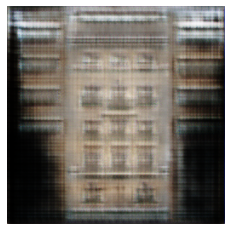

INFO:root:speed: 55.80062235668036 samples/s
INFO:root:discriminator loss = 0.477377, generator loss = 27.135406, binary training acc = 0.661878 at iter 0 epoch 13
INFO:root:speed: 26.36950211525416 samples/s
INFO:root:discriminator loss = 0.411352, generator loss = 27.188736, binary training acc = 0.769952 at iter 10 epoch 13
INFO:root:speed: 25.615118297970053 samples/s
INFO:root:discriminator loss = 0.252243, generator loss = 28.113684, binary training acc = 0.813716 at iter 20 epoch 13
INFO:root:speed: 24.816384489996363 samples/s
INFO:root:discriminator loss = 0.354076, generator loss = 28.551462, binary training acc = 0.837109 at iter 30 epoch 13
INFO:root:
binary training acc at epoch 13: facc=0.825509
INFO:root:time: 15.345545


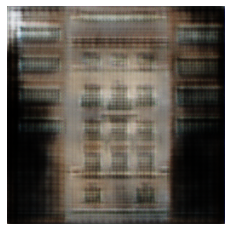

INFO:root:speed: 60.03956541032652 samples/s
INFO:root:discriminator loss = 0.473710, generator loss = 26.760204, binary training acc = 0.837020 at iter 0 epoch 14
INFO:root:speed: 25.130249618639855 samples/s
INFO:root:discriminator loss = 0.306751, generator loss = 28.009472, binary training acc = 0.836048 at iter 10 epoch 14
INFO:root:speed: 26.30300825907275 samples/s
INFO:root:discriminator loss = 0.284262, generator loss = 27.498814, binary training acc = 0.852853 at iter 20 epoch 14
INFO:root:speed: 25.173733587093064 samples/s
INFO:root:discriminator loss = 0.313677, generator loss = 27.779425, binary training acc = 0.865564 at iter 30 epoch 14
INFO:root:
binary training acc at epoch 14: facc=0.870989
INFO:root:time: 15.346823


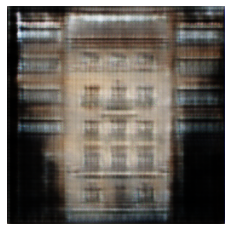

INFO:root:speed: 60.87179390426376 samples/s
INFO:root:discriminator loss = 0.380058, generator loss = 26.311844, binary training acc = 0.906735 at iter 0 epoch 15
INFO:root:speed: 24.581987058176082 samples/s
INFO:root:discriminator loss = 0.180308, generator loss = 26.488001, binary training acc = 0.851147 at iter 10 epoch 15
INFO:root:speed: 25.656138462150153 samples/s
INFO:root:discriminator loss = 0.349784, generator loss = 27.576748, binary training acc = 0.807017 at iter 20 epoch 15
INFO:root:speed: 25.5447289647339 samples/s
INFO:root:discriminator loss = 0.375516, generator loss = 26.951426, binary training acc = 0.796683 at iter 30 epoch 15
INFO:root:
binary training acc at epoch 15: facc=0.824931
INFO:root:time: 15.372934


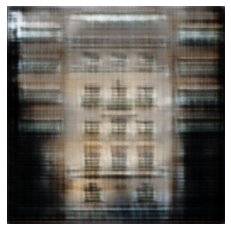

INFO:root:speed: 57.754724073877725 samples/s
INFO:root:discriminator loss = 0.634887, generator loss = 26.719864, binary training acc = 0.737796 at iter 0 epoch 16
INFO:root:speed: 25.36844174421101 samples/s
INFO:root:discriminator loss = 0.349586, generator loss = 27.593927, binary training acc = 0.866353 at iter 10 epoch 16
INFO:root:speed: 25.06263112261574 samples/s
INFO:root:discriminator loss = 0.332615, generator loss = 27.519703, binary training acc = 0.841022 at iter 20 epoch 16
INFO:root:speed: 25.74418250651844 samples/s
INFO:root:discriminator loss = 0.301458, generator loss = 26.595089, binary training acc = 0.819011 at iter 30 epoch 16
INFO:root:
binary training acc at epoch 16: facc=0.837779
INFO:root:time: 15.412057


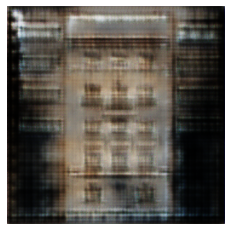

INFO:root:speed: 54.97763172899591 samples/s
INFO:root:discriminator loss = 0.201710, generator loss = 24.526688, binary training acc = 0.959102 at iter 0 epoch 17
INFO:root:speed: 25.69899068004257 samples/s
INFO:root:discriminator loss = 0.160457, generator loss = 25.432413, binary training acc = 0.838423 at iter 10 epoch 17
INFO:root:speed: 24.98612875918966 samples/s
INFO:root:discriminator loss = 0.247227, generator loss = 26.158611, binary training acc = 0.847858 at iter 20 epoch 17
INFO:root:speed: 25.923377681305247 samples/s
INFO:root:discriminator loss = 0.551480, generator loss = 26.904928, binary training acc = 0.831361 at iter 30 epoch 17
INFO:root:
binary training acc at epoch 17: facc=0.831613
INFO:root:time: 15.399741


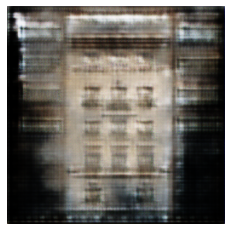

INFO:root:speed: 55.3951405315382 samples/s
INFO:root:discriminator loss = 0.372960, generator loss = 24.557123, binary training acc = 0.745918 at iter 0 epoch 18
INFO:root:speed: 26.268299266557566 samples/s
INFO:root:discriminator loss = 0.254804, generator loss = 25.730505, binary training acc = 0.804835 at iter 10 epoch 18
INFO:root:speed: 25.579079610182102 samples/s
INFO:root:discriminator loss = 0.170198, generator loss = 25.211910, binary training acc = 0.838997 at iter 20 epoch 18
INFO:root:speed: 25.692017063065226 samples/s
INFO:root:discriminator loss = 0.272687, generator loss = 26.572327, binary training acc = 0.851161 at iter 30 epoch 18
INFO:root:
binary training acc at epoch 18: facc=0.849358
INFO:root:time: 15.402443


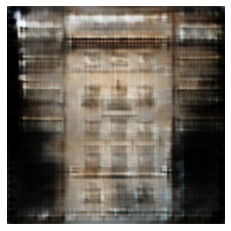

INFO:root:speed: 62.80346067806051 samples/s
INFO:root:discriminator loss = 0.515407, generator loss = 25.433430, binary training acc = 0.830204 at iter 0 epoch 19
INFO:root:speed: 26.276132488765793 samples/s
INFO:root:discriminator loss = 0.370834, generator loss = 24.975336, binary training acc = 0.762341 at iter 10 epoch 19
INFO:root:speed: 25.779278011267323 samples/s
INFO:root:discriminator loss = 0.219146, generator loss = 24.678947, binary training acc = 0.788614 at iter 20 epoch 19
INFO:root:speed: 25.64827837555555 samples/s
INFO:root:discriminator loss = 0.342738, generator loss = 25.981388, binary training acc = 0.798409 at iter 30 epoch 19
INFO:root:
binary training acc at epoch 19: facc=0.819473
INFO:root:time: 15.413689


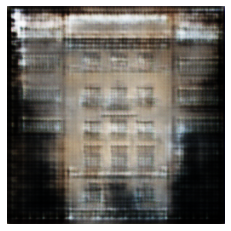

INFO:root:speed: 57.73421336985623 samples/s
INFO:root:discriminator loss = 0.532474, generator loss = 23.885645, binary training acc = 0.555878 at iter 0 epoch 20
INFO:root:speed: 25.94285933420628 samples/s
INFO:root:discriminator loss = 0.374525, generator loss = 26.174316, binary training acc = 0.813878 at iter 10 epoch 20
INFO:root:speed: 26.516757325402907 samples/s
INFO:root:discriminator loss = 0.375399, generator loss = 25.733038, binary training acc = 0.818002 at iter 20 epoch 20
INFO:root:speed: 25.385715063883357 samples/s
INFO:root:discriminator loss = 0.409128, generator loss = 25.623978, binary training acc = 0.808724 at iter 30 epoch 20
INFO:root:
binary training acc at epoch 20: facc=0.814007
INFO:root:time: 15.412645


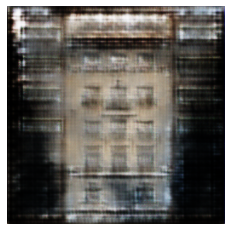

INFO:root:speed: 60.08119110851361 samples/s
INFO:root:discriminator loss = 0.915335, generator loss = 24.151091, binary training acc = 0.501184 at iter 0 epoch 21
INFO:root:speed: 26.06593819079207 samples/s
INFO:root:discriminator loss = 0.191134, generator loss = 24.772465, binary training acc = 0.816482 at iter 10 epoch 21
INFO:root:speed: 25.591315447150503 samples/s
INFO:root:discriminator loss = 0.202528, generator loss = 23.745674, binary training acc = 0.837160 at iter 20 epoch 21
INFO:root:speed: 25.064668012833806 samples/s
INFO:root:discriminator loss = 0.360443, generator loss = 24.878942, binary training acc = 0.830781 at iter 30 epoch 21
INFO:root:
binary training acc at epoch 21: facc=0.839906
INFO:root:time: 15.403652


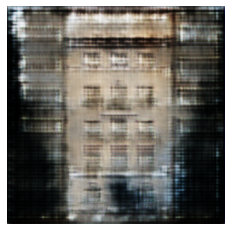

INFO:root:speed: 57.5264329476114 samples/s
INFO:root:discriminator loss = 0.355734, generator loss = 23.104984, binary training acc = 0.673469 at iter 0 epoch 22
INFO:root:speed: 26.186576762190175 samples/s
INFO:root:discriminator loss = 0.471709, generator loss = 24.258572, binary training acc = 0.766560 at iter 10 epoch 22
INFO:root:speed: 24.97696319053112 samples/s
INFO:root:discriminator loss = 0.404879, generator loss = 23.924646, binary training acc = 0.776968 at iter 20 epoch 22
INFO:root:speed: 25.944672696479227 samples/s
INFO:root:discriminator loss = 0.286446, generator loss = 23.500635, binary training acc = 0.792752 at iter 30 epoch 22
INFO:root:
binary training acc at epoch 22: facc=0.784729
INFO:root:time: 15.382818


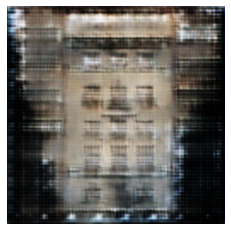

INFO:root:speed: 57.58013478321154 samples/s
INFO:root:discriminator loss = 0.440436, generator loss = 22.712358, binary training acc = 0.666571 at iter 0 epoch 23
INFO:root:speed: 26.236438608431083 samples/s
INFO:root:discriminator loss = 0.242213, generator loss = 24.295908, binary training acc = 0.820416 at iter 10 epoch 23
INFO:root:speed: 25.31671669484461 samples/s
INFO:root:discriminator loss = 0.241569, generator loss = 22.908348, binary training acc = 0.826680 at iter 20 epoch 23
INFO:root:speed: 25.66767844903554 samples/s
INFO:root:discriminator loss = 0.771870, generator loss = 24.550838, binary training acc = 0.797282 at iter 30 epoch 23
INFO:root:
binary training acc at epoch 23: facc=0.804615
INFO:root:time: 15.413795


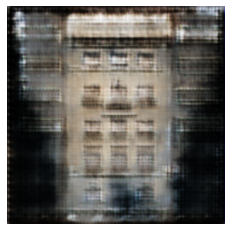

INFO:root:speed: 60.8176877613637 samples/s
INFO:root:discriminator loss = 0.298589, generator loss = 22.125286, binary training acc = 0.894939 at iter 0 epoch 24
INFO:root:speed: 26.425340278775323 samples/s
INFO:root:discriminator loss = 0.220150, generator loss = 23.656094, binary training acc = 0.801135 at iter 10 epoch 24
INFO:root:speed: 26.21656286643648 samples/s
INFO:root:discriminator loss = 0.771964, generator loss = 24.787975, binary training acc = 0.821481 at iter 20 epoch 24
INFO:root:speed: 26.422909786855524 samples/s
INFO:root:discriminator loss = 0.258171, generator loss = 22.513172, binary training acc = 0.816927 at iter 30 epoch 24
INFO:root:
binary training acc at epoch 24: facc=0.831777
INFO:root:time: 15.422627


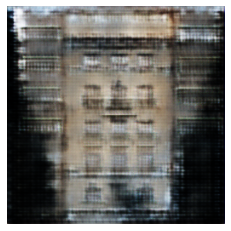

INFO:root:speed: 61.984940849608 samples/s
INFO:root:discriminator loss = 0.522393, generator loss = 22.743271, binary training acc = 0.539102 at iter 0 epoch 25
INFO:root:speed: 25.35263233610536 samples/s
INFO:root:discriminator loss = 0.268364, generator loss = 23.154583, binary training acc = 0.805506 at iter 10 epoch 25
INFO:root:speed: 25.95393603072169 samples/s
INFO:root:discriminator loss = 0.264973, generator loss = 22.271900, binary training acc = 0.837052 at iter 20 epoch 25
INFO:root:speed: 25.468197724301543 samples/s
INFO:root:discriminator loss = 0.504517, generator loss = 22.527248, binary training acc = 0.812299 at iter 30 epoch 25
INFO:root:
binary training acc at epoch 25: facc=0.799671
INFO:root:time: 15.401513


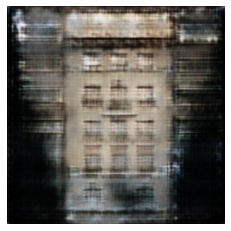

INFO:root:speed: 58.92904159436885 samples/s
INFO:root:discriminator loss = 0.571387, generator loss = 21.867968, binary training acc = 0.735551 at iter 0 epoch 26
INFO:root:speed: 25.893690460095183 samples/s
INFO:root:discriminator loss = 0.199718, generator loss = 22.005322, binary training acc = 0.795466 at iter 10 epoch 26
INFO:root:speed: 25.42299796279201 samples/s
INFO:root:discriminator loss = 0.474105, generator loss = 23.241348, binary training acc = 0.785364 at iter 20 epoch 26
INFO:root:speed: 25.197250010212738 samples/s
INFO:root:discriminator loss = 0.170801, generator loss = 20.964619, binary training acc = 0.799203 at iter 30 epoch 26
INFO:root:
binary training acc at epoch 26: facc=0.798419
INFO:root:time: 15.420663


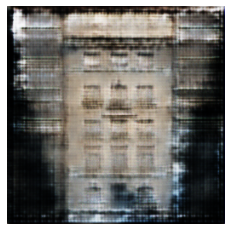

INFO:root:speed: 56.97466617764918 samples/s
INFO:root:discriminator loss = 0.552316, generator loss = 21.393650, binary training acc = 0.555510 at iter 0 epoch 27
INFO:root:speed: 25.160776748184315 samples/s
INFO:root:discriminator loss = 0.265744, generator loss = 22.251907, binary training acc = 0.814649 at iter 10 epoch 27
INFO:root:speed: 25.05248156291307 samples/s
INFO:root:discriminator loss = 0.471116, generator loss = 23.162535, binary training acc = 0.823040 at iter 20 epoch 27
INFO:root:speed: 25.204972363074326 samples/s
INFO:root:discriminator loss = 0.377908, generator loss = 21.506699, binary training acc = 0.806632 at iter 30 epoch 27
INFO:root:
binary training acc at epoch 27: facc=0.806617
INFO:root:time: 15.428801


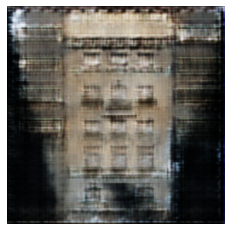

INFO:root:speed: 59.474102139437804 samples/s
INFO:root:discriminator loss = 0.524859, generator loss = 21.769783, binary training acc = 0.588694 at iter 0 epoch 28
INFO:root:speed: 24.907695587548005 samples/s
INFO:root:discriminator loss = 0.291869, generator loss = 22.142168, binary training acc = 0.718761 at iter 10 epoch 28
INFO:root:speed: 25.029040294788977 samples/s
INFO:root:discriminator loss = 0.232415, generator loss = 21.401899, binary training acc = 0.801510 at iter 20 epoch 28
INFO:root:speed: 25.443262422103096 samples/s
INFO:root:discriminator loss = 0.620143, generator loss = 22.286175, binary training acc = 0.792486 at iter 30 epoch 28
INFO:root:
binary training acc at epoch 28: facc=0.802073
INFO:root:time: 15.416832


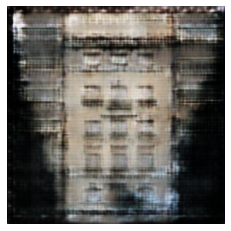

INFO:root:speed: 54.46914612750363 samples/s
INFO:root:discriminator loss = 0.480124, generator loss = 21.175930, binary training acc = 0.590490 at iter 0 epoch 29
INFO:root:speed: 26.022694065655077 samples/s
INFO:root:discriminator loss = 0.231813, generator loss = 21.468422, binary training acc = 0.759347 at iter 10 epoch 29
INFO:root:speed: 25.527813501006978 samples/s
INFO:root:discriminator loss = 0.318172, generator loss = 21.508387, binary training acc = 0.789502 at iter 20 epoch 29
INFO:root:speed: 25.062780882678954 samples/s
INFO:root:discriminator loss = 0.301159, generator loss = 21.364826, binary training acc = 0.785641 at iter 30 epoch 29
INFO:root:
binary training acc at epoch 29: facc=0.771569
INFO:root:time: 15.405931


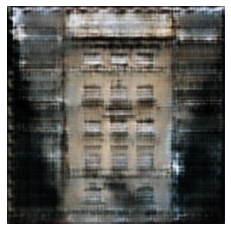

INFO:root:speed: 57.98675829956548 samples/s
INFO:root:discriminator loss = 0.631560, generator loss = 20.609201, binary training acc = 0.633306 at iter 0 epoch 30
INFO:root:speed: 26.06601918578492 samples/s
INFO:root:discriminator loss = 0.404793, generator loss = 22.179092, binary training acc = 0.771284 at iter 10 epoch 30
INFO:root:speed: 26.24001681641703 samples/s
INFO:root:discriminator loss = 0.245294, generator loss = 21.136120, binary training acc = 0.828087 at iter 20 epoch 30
INFO:root:speed: 25.16621155965802 samples/s
INFO:root:discriminator loss = 0.850130, generator loss = 21.912317, binary training acc = 0.795747 at iter 30 epoch 30
INFO:root:
binary training acc at epoch 30: facc=0.793157
INFO:root:time: 15.413682


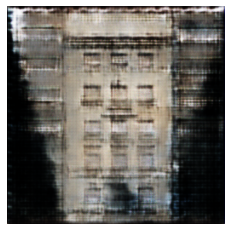

INFO:root:speed: 55.191478442802534 samples/s
INFO:root:discriminator loss = 0.524437, generator loss = 21.068775, binary training acc = 0.833878 at iter 0 epoch 31
INFO:root:speed: 25.984341139634957 samples/s
INFO:root:discriminator loss = 0.578731, generator loss = 21.823004, binary training acc = 0.779258 at iter 10 epoch 31
INFO:root:speed: 26.28280098957537 samples/s
INFO:root:discriminator loss = 1.038926, generator loss = 23.067543, binary training acc = 0.792356 at iter 20 epoch 31
INFO:root:speed: 25.672910187440284 samples/s
INFO:root:discriminator loss = 0.312342, generator loss = 20.554478, binary training acc = 0.771573 at iter 30 epoch 31
INFO:root:
binary training acc at epoch 31: facc=0.801214
INFO:root:time: 15.365044


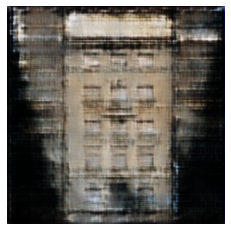

INFO:root:speed: 60.80816515889585 samples/s
INFO:root:discriminator loss = 0.535586, generator loss = 20.595003, binary training acc = 0.532082 at iter 0 epoch 32
INFO:root:speed: 25.534449527153804 samples/s
INFO:root:discriminator loss = 0.535820, generator loss = 21.706509, binary training acc = 0.791295 at iter 10 epoch 32
INFO:root:speed: 25.000366573940347 samples/s
INFO:root:discriminator loss = 0.247192, generator loss = 20.325808, binary training acc = 0.799646 at iter 20 epoch 32
INFO:root:speed: 25.46117876592043 samples/s
INFO:root:discriminator loss = 0.250639, generator loss = 19.426174, binary training acc = 0.815310 at iter 30 epoch 32
INFO:root:
binary training acc at epoch 32: facc=0.804355
INFO:root:time: 15.401926


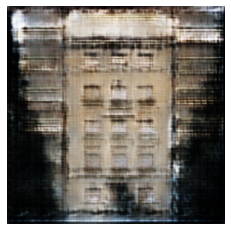

INFO:root:speed: 62.748402230892594 samples/s
INFO:root:discriminator loss = 0.550229, generator loss = 20.324999, binary training acc = 0.530408 at iter 0 epoch 33
INFO:root:speed: 26.282702172270188 samples/s
INFO:root:discriminator loss = 0.544753, generator loss = 21.691433, binary training acc = 0.772549 at iter 10 epoch 33
INFO:root:speed: 26.041290521259924 samples/s
INFO:root:discriminator loss = 0.284497, generator loss = 19.957167, binary training acc = 0.773718 at iter 20 epoch 33
INFO:root:speed: 25.48865824763287 samples/s
INFO:root:discriminator loss = 0.273103, generator loss = 19.483856, binary training acc = 0.792887 at iter 30 epoch 33
INFO:root:
binary training acc at epoch 33: facc=0.805507
INFO:root:time: 15.405805


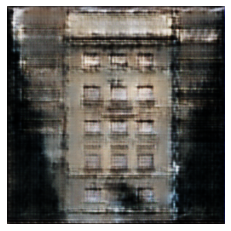

INFO:root:speed: 60.28663541877777 samples/s
INFO:root:discriminator loss = 0.723409, generator loss = 20.952414, binary training acc = 0.502449 at iter 0 epoch 34
INFO:root:speed: 25.45485883105486 samples/s
INFO:root:discriminator loss = 0.282357, generator loss = 20.265774, binary training acc = 0.762219 at iter 10 epoch 34
INFO:root:speed: 25.84125231654903 samples/s
INFO:root:discriminator loss = 0.495457, generator loss = 20.516153, binary training acc = 0.790346 at iter 20 epoch 34
INFO:root:speed: 26.049894913620488 samples/s
INFO:root:discriminator loss = 0.229951, generator loss = 19.153913, binary training acc = 0.791027 at iter 30 epoch 34
INFO:root:
binary training acc at epoch 34: facc=0.788304
INFO:root:time: 15.401175


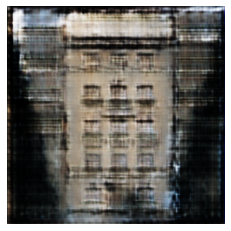

INFO:root:speed: 58.101624760524786 samples/s
INFO:root:discriminator loss = 0.371642, generator loss = 20.084160, binary training acc = 0.777469 at iter 0 epoch 35
INFO:root:speed: 25.726007820286743 samples/s
INFO:root:discriminator loss = 0.549087, generator loss = 21.012630, binary training acc = 0.745555 at iter 10 epoch 35
INFO:root:speed: 25.624914849459955 samples/s
INFO:root:discriminator loss = 0.280306, generator loss = 19.849237, binary training acc = 0.782503 at iter 20 epoch 35
INFO:root:speed: 25.982280798912715 samples/s
INFO:root:discriminator loss = 0.187875, generator loss = 19.101109, binary training acc = 0.754327 at iter 30 epoch 35
INFO:root:
binary training acc at epoch 35: facc=0.763524
INFO:root:time: 15.388770


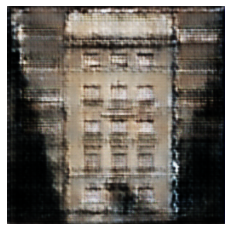

INFO:root:speed: 60.5764892446252 samples/s
INFO:root:discriminator loss = 0.542593, generator loss = 19.977024, binary training acc = 0.801184 at iter 0 epoch 36
INFO:root:speed: 25.10789506450717 samples/s
INFO:root:discriminator loss = 0.336607, generator loss = 20.147121, binary training acc = 0.723024 at iter 10 epoch 36
INFO:root:speed: 25.9628202715685 samples/s
INFO:root:discriminator loss = 0.320535, generator loss = 19.528131, binary training acc = 0.779347 at iter 20 epoch 36
INFO:root:speed: 26.253024762682095 samples/s
INFO:root:discriminator loss = 0.352525, generator loss = 19.786551, binary training acc = 0.781962 at iter 30 epoch 36
INFO:root:
binary training acc at epoch 36: facc=0.798515
INFO:root:time: 15.364080


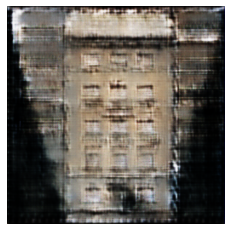

INFO:root:speed: 56.75379379866989 samples/s
INFO:root:discriminator loss = 0.631446, generator loss = 19.826534, binary training acc = 0.539224 at iter 0 epoch 37
INFO:root:speed: 25.957742817888132 samples/s
INFO:root:discriminator loss = 0.418358, generator loss = 19.833063, binary training acc = 0.775414 at iter 10 epoch 37
INFO:root:speed: 24.95155501645172 samples/s
INFO:root:discriminator loss = 0.339720, generator loss = 19.456264, binary training acc = 0.776395 at iter 20 epoch 37
INFO:root:speed: 25.97756577997965 samples/s
INFO:root:discriminator loss = 0.759632, generator loss = 20.656200, binary training acc = 0.747696 at iter 30 epoch 37
INFO:root:
binary training acc at epoch 37: facc=0.769354
INFO:root:time: 15.389009


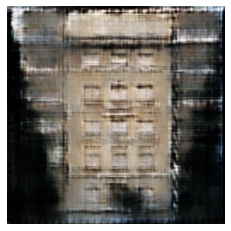

INFO:root:speed: 57.34373120125999 samples/s
INFO:root:discriminator loss = 0.682598, generator loss = 19.624405, binary training acc = 0.565224 at iter 0 epoch 38
INFO:root:speed: 26.452188643285233 samples/s
INFO:root:discriminator loss = 0.599379, generator loss = 20.895689, binary training acc = 0.735855 at iter 10 epoch 38
INFO:root:speed: 25.602578384663982 samples/s
INFO:root:discriminator loss = 0.270710, generator loss = 19.140858, binary training acc = 0.787528 at iter 20 epoch 38
INFO:root:speed: 25.84040853719018 samples/s
INFO:root:discriminator loss = 0.357048, generator loss = 18.847458, binary training acc = 0.772773 at iter 30 epoch 38
INFO:root:
binary training acc at epoch 38: facc=0.791603
INFO:root:time: 15.333773


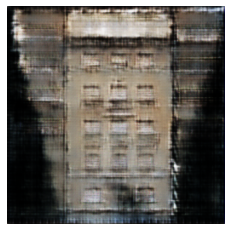

INFO:root:speed: 59.75106950081415 samples/s
INFO:root:discriminator loss = 0.456987, generator loss = 19.428375, binary training acc = 0.887061 at iter 0 epoch 39
INFO:root:speed: 25.836476933652992 samples/s
INFO:root:discriminator loss = 0.344692, generator loss = 19.842823, binary training acc = 0.797113 at iter 10 epoch 39
INFO:root:speed: 25.066855042919546 samples/s
INFO:root:discriminator loss = 0.365832, generator loss = 19.881598, binary training acc = 0.773730 at iter 20 epoch 39
INFO:root:speed: 25.52141385930165 samples/s
INFO:root:discriminator loss = 0.502920, generator loss = 18.873743, binary training acc = 0.762253 at iter 30 epoch 39
INFO:root:
binary training acc at epoch 39: facc=0.774732
INFO:root:time: 15.323884


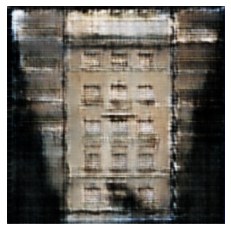

INFO:root:speed: 57.18634662449127 samples/s
INFO:root:discriminator loss = 0.720367, generator loss = 18.908718, binary training acc = 0.520571 at iter 0 epoch 40
INFO:root:speed: 26.030171461481366 samples/s
INFO:root:discriminator loss = 0.381099, generator loss = 19.328259, binary training acc = 0.740167 at iter 10 epoch 40
INFO:root:speed: 26.020918210034512 samples/s
INFO:root:discriminator loss = 0.449761, generator loss = 19.212896, binary training acc = 0.750636 at iter 20 epoch 40
INFO:root:speed: 25.796845804595367 samples/s
INFO:root:discriminator loss = 1.039109, generator loss = 18.716827, binary training acc = 0.713306 at iter 30 epoch 40
INFO:root:
binary training acc at epoch 40: facc=0.723312
INFO:root:time: 15.340803


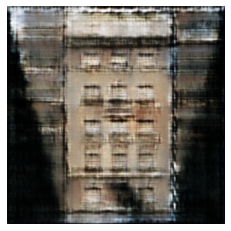

INFO:root:speed: 63.47821480839111 samples/s
INFO:root:discriminator loss = 0.445215, generator loss = 18.327465, binary training acc = 0.765347 at iter 0 epoch 41
INFO:root:speed: 25.67705938782344 samples/s
INFO:root:discriminator loss = 0.313065, generator loss = 18.858150, binary training acc = 0.783061 at iter 10 epoch 41
INFO:root:speed: 25.720249702589008 samples/s
INFO:root:discriminator loss = 0.259052, generator loss = 18.458481, binary training acc = 0.785158 at iter 20 epoch 41
INFO:root:speed: 25.640109619723727 samples/s
INFO:root:discriminator loss = 0.252020, generator loss = 18.221643, binary training acc = 0.803616 at iter 30 epoch 41
INFO:root:
binary training acc at epoch 41: facc=0.786562
INFO:root:time: 15.370337


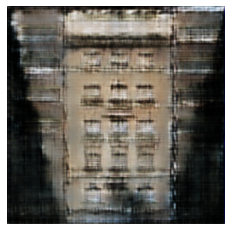

INFO:root:speed: 61.07112800128132 samples/s
INFO:root:discriminator loss = 0.370878, generator loss = 17.955957, binary training acc = 0.854204 at iter 0 epoch 42
INFO:root:speed: 25.699573297909627 samples/s
INFO:root:discriminator loss = 0.297362, generator loss = 18.845423, binary training acc = 0.796096 at iter 10 epoch 42
INFO:root:speed: 25.294334395328907 samples/s
INFO:root:discriminator loss = 0.331477, generator loss = 18.590731, binary training acc = 0.783497 at iter 20 epoch 42
INFO:root:speed: 25.261078474712445 samples/s
INFO:root:discriminator loss = 0.397832, generator loss = 17.582289, binary training acc = 0.769369 at iter 30 epoch 42
INFO:root:
binary training acc at epoch 42: facc=0.779060
INFO:root:time: 15.352310


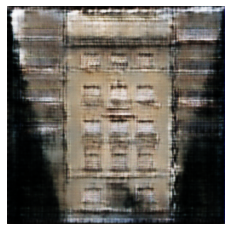

INFO:root:speed: 59.5407151465768 samples/s
INFO:root:discriminator loss = 0.768842, generator loss = 19.131296, binary training acc = 0.500816 at iter 0 epoch 43
INFO:root:speed: 25.66304550669216 samples/s
INFO:root:discriminator loss = 0.246813, generator loss = 18.079008, binary training acc = 0.769399 at iter 10 epoch 43
INFO:root:speed: 24.835016611728456 samples/s
INFO:root:discriminator loss = 0.785768, generator loss = 19.660015, binary training acc = 0.781990 at iter 20 epoch 43
INFO:root:speed: 25.3931229218985 samples/s
INFO:root:discriminator loss = 0.195358, generator loss = 17.834110, binary training acc = 0.791559 at iter 30 epoch 43
INFO:root:
binary training acc at epoch 43: facc=0.792264
INFO:root:time: 15.375385


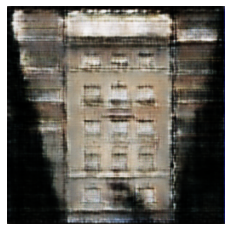

INFO:root:speed: 58.8707295848188 samples/s
INFO:root:discriminator loss = 0.563377, generator loss = 18.403584, binary training acc = 0.545265 at iter 0 epoch 44
INFO:root:speed: 25.51363609266971 samples/s
INFO:root:discriminator loss = 0.225546, generator loss = 18.068642, binary training acc = 0.775299 at iter 10 epoch 44
INFO:root:speed: 26.581641997724816 samples/s
INFO:root:discriminator loss = 0.508544, generator loss = 18.495665, binary training acc = 0.739285 at iter 20 epoch 44
INFO:root:speed: 25.761718306139308 samples/s
INFO:root:discriminator loss = 0.507119, generator loss = 18.412680, binary training acc = 0.743885 at iter 30 epoch 44
INFO:root:
binary training acc at epoch 44: facc=0.752910
INFO:root:time: 15.339064


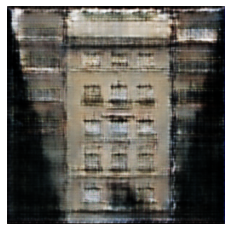

INFO:root:speed: 61.672597236844425 samples/s
INFO:root:discriminator loss = 0.365765, generator loss = 18.089651, binary training acc = 0.941837 at iter 0 epoch 45
INFO:root:speed: 26.630670670924896 samples/s
INFO:root:discriminator loss = 0.436696, generator loss = 18.713985, binary training acc = 0.793644 at iter 10 epoch 45
INFO:root:speed: 25.16402225600647 samples/s
INFO:root:discriminator loss = 0.400471, generator loss = 17.748503, binary training acc = 0.775042 at iter 20 epoch 45
INFO:root:speed: 25.766909306930206 samples/s
INFO:root:discriminator loss = 0.534398, generator loss = 18.170206, binary training acc = 0.781371 at iter 30 epoch 45
INFO:root:
binary training acc at epoch 45: facc=0.786555
INFO:root:time: 15.352952


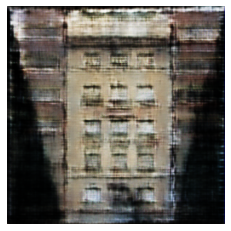

INFO:root:speed: 61.61045157158428 samples/s
INFO:root:discriminator loss = 0.464069, generator loss = 18.078764, binary training acc = 0.693143 at iter 0 epoch 46
INFO:root:speed: 26.054798077526353 samples/s
INFO:root:discriminator loss = 0.339776, generator loss = 17.938463, binary training acc = 0.811373 at iter 10 epoch 46
INFO:root:speed: 25.226089126924222 samples/s
INFO:root:discriminator loss = 0.376781, generator loss = 17.744175, binary training acc = 0.766608 at iter 20 epoch 46
INFO:root:speed: 25.2699970357803 samples/s
INFO:root:discriminator loss = 0.331537, generator loss = 17.511684, binary training acc = 0.767521 at iter 30 epoch 46
INFO:root:
binary training acc at epoch 46: facc=0.782416
INFO:root:time: 15.367947


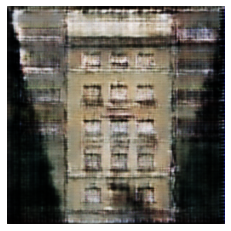

INFO:root:speed: 60.86773039610498 samples/s
INFO:root:discriminator loss = 0.696327, generator loss = 18.041004, binary training acc = 0.515143 at iter 0 epoch 47
INFO:root:speed: 25.445299906998528 samples/s
INFO:root:discriminator loss = 0.503379, generator loss = 18.987686, binary training acc = 0.786108 at iter 10 epoch 47
INFO:root:speed: 26.138989016686857 samples/s
INFO:root:discriminator loss = 0.672082, generator loss = 18.606157, binary training acc = 0.780327 at iter 20 epoch 47
INFO:root:speed: 25.68479556837729 samples/s
INFO:root:discriminator loss = 0.801479, generator loss = 18.628353, binary training acc = 0.757654 at iter 30 epoch 47
INFO:root:
binary training acc at epoch 47: facc=0.756464
INFO:root:time: 15.401933


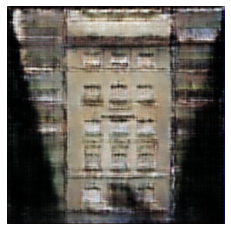

INFO:root:speed: 63.760179379014176 samples/s
INFO:root:discriminator loss = 0.652662, generator loss = 18.250683, binary training acc = 0.554286 at iter 0 epoch 48
INFO:root:speed: 26.16188002584811 samples/s
INFO:root:discriminator loss = 0.419506, generator loss = 18.452251, binary training acc = 0.706724 at iter 10 epoch 48
INFO:root:speed: 25.682578015739082 samples/s
INFO:root:discriminator loss = 0.420556, generator loss = 17.670755, binary training acc = 0.767722 at iter 20 epoch 48
INFO:root:speed: 25.76545308342942 samples/s
INFO:root:discriminator loss = 0.344690, generator loss = 17.777781, binary training acc = 0.785889 at iter 30 epoch 48
INFO:root:
binary training acc at epoch 48: facc=0.783251
INFO:root:time: 15.430722


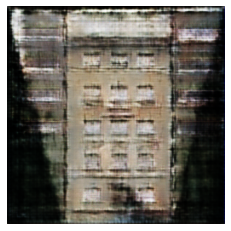

INFO:root:speed: 60.35534258599725 samples/s
INFO:root:discriminator loss = 0.505024, generator loss = 18.241856, binary training acc = 0.728082 at iter 0 epoch 49
INFO:root:speed: 26.26996096744615 samples/s
INFO:root:discriminator loss = 0.330784, generator loss = 17.500126, binary training acc = 0.755718 at iter 10 epoch 49
INFO:root:speed: 25.590456683939276 samples/s
INFO:root:discriminator loss = 0.402715, generator loss = 17.933733, binary training acc = 0.763291 at iter 20 epoch 49
INFO:root:speed: 26.14337172693937 samples/s
INFO:root:discriminator loss = 0.340366, generator loss = 16.628613, binary training acc = 0.750467 at iter 30 epoch 49
INFO:root:
binary training acc at epoch 49: facc=0.756474
INFO:root:time: 15.390624


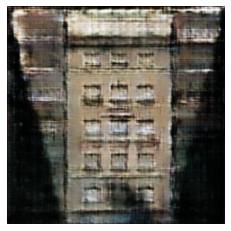

INFO:root:speed: 57.64914638990484 samples/s
INFO:root:discriminator loss = 0.529271, generator loss = 18.283848, binary training acc = 0.837837 at iter 0 epoch 50
INFO:root:speed: 25.540280265078422 samples/s
INFO:root:discriminator loss = 0.435385, generator loss = 18.148785, binary training acc = 0.783673 at iter 10 epoch 50
INFO:root:speed: 25.768808976283232 samples/s
INFO:root:discriminator loss = 0.504484, generator loss = 18.509548, binary training acc = 0.765811 at iter 20 epoch 50
INFO:root:speed: 25.90534918423211 samples/s
INFO:root:discriminator loss = 0.735172, generator loss = 17.272177, binary training acc = 0.736952 at iter 30 epoch 50
INFO:root:
binary training acc at epoch 50: facc=0.744253
INFO:root:time: 15.387112


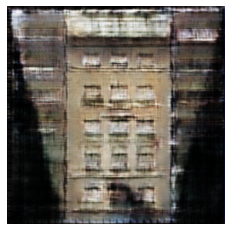

INFO:root:speed: 58.496250458494245 samples/s
INFO:root:discriminator loss = 0.475131, generator loss = 17.418400, binary training acc = 0.627265 at iter 0 epoch 51
INFO:root:speed: 25.805194134019782 samples/s
INFO:root:discriminator loss = 0.415484, generator loss = 17.178171, binary training acc = 0.773332 at iter 10 epoch 51
INFO:root:speed: 25.45261902060032 samples/s
INFO:root:discriminator loss = 0.458158, generator loss = 17.503483, binary training acc = 0.732704 at iter 20 epoch 51
INFO:root:speed: 25.209638351454828 samples/s
INFO:root:discriminator loss = 0.469019, generator loss = 17.454388, binary training acc = 0.750244 at iter 30 epoch 51
INFO:root:
binary training acc at epoch 51: facc=0.749959
INFO:root:time: 15.407621


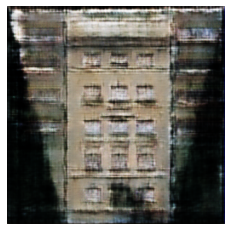

INFO:root:speed: 58.24872095413211 samples/s
INFO:root:discriminator loss = 0.479168, generator loss = 17.064817, binary training acc = 0.666694 at iter 0 epoch 52
INFO:root:speed: 25.085640259474616 samples/s
INFO:root:discriminator loss = 0.420153, generator loss = 17.160755, binary training acc = 0.711362 at iter 10 epoch 52
INFO:root:speed: 25.768144060148344 samples/s
INFO:root:discriminator loss = 0.480794, generator loss = 17.564701, binary training acc = 0.747516 at iter 20 epoch 52
INFO:root:speed: 25.999385085344205 samples/s
INFO:root:discriminator loss = 0.316709, generator loss = 16.544495, binary training acc = 0.766757 at iter 30 epoch 52
INFO:root:
binary training acc at epoch 52: facc=0.778617
INFO:root:time: 15.397148


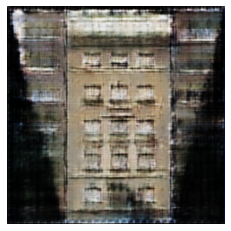

INFO:root:speed: 59.01809672694219 samples/s
INFO:root:discriminator loss = 0.787325, generator loss = 18.174257, binary training acc = 0.525184 at iter 0 epoch 53
INFO:root:speed: 26.437966050413813 samples/s
INFO:root:discriminator loss = 0.550468, generator loss = 17.461248, binary training acc = 0.629046 at iter 10 epoch 53
INFO:root:speed: 25.597906421227755 samples/s
INFO:root:discriminator loss = 0.530506, generator loss = 17.476894, binary training acc = 0.698816 at iter 20 epoch 53
INFO:root:speed: 25.868729107303654 samples/s
INFO:root:discriminator loss = 0.375057, generator loss = 16.805124, binary training acc = 0.718787 at iter 30 epoch 53
INFO:root:
binary training acc at epoch 53: facc=0.735823
INFO:root:time: 15.398757


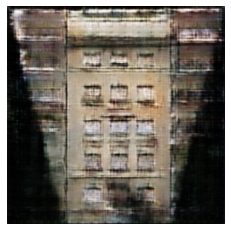

INFO:root:speed: 61.04783917374522 samples/s
INFO:root:discriminator loss = 0.367160, generator loss = 16.679432, binary training acc = 0.899633 at iter 0 epoch 54
INFO:root:speed: 25.2652325841255 samples/s
INFO:root:discriminator loss = 0.477738, generator loss = 17.453848, binary training acc = 0.758924 at iter 10 epoch 54
INFO:root:speed: 25.366109729199817 samples/s
INFO:root:discriminator loss = 0.483583, generator loss = 17.019817, binary training acc = 0.750441 at iter 20 epoch 54
INFO:root:speed: 25.54726510584231 samples/s
INFO:root:discriminator loss = 1.333024, generator loss = 17.862728, binary training acc = 0.727722 at iter 30 epoch 54
INFO:root:
binary training acc at epoch 54: facc=0.732361
INFO:root:time: 15.405102


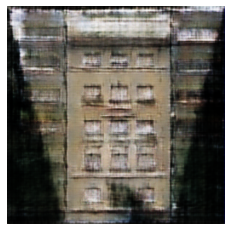

INFO:root:speed: 58.74605726835226 samples/s
INFO:root:discriminator loss = 0.406928, generator loss = 16.587278, binary training acc = 0.601061 at iter 0 epoch 55
INFO:root:speed: 25.57486844592411 samples/s
INFO:root:discriminator loss = 0.423296, generator loss = 17.066008, binary training acc = 0.801020 at iter 10 epoch 55
INFO:root:speed: 25.40141193513359 samples/s
INFO:root:discriminator loss = 0.311913, generator loss = 16.538059, binary training acc = 0.793887 at iter 20 epoch 55
INFO:root:speed: 25.23627358132964 samples/s
INFO:root:discriminator loss = 0.378676, generator loss = 16.421400, binary training acc = 0.786253 at iter 30 epoch 55
INFO:root:
binary training acc at epoch 55: facc=0.794919
INFO:root:time: 15.432026


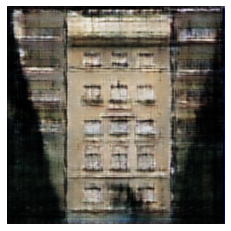

INFO:root:speed: 56.90486559675907 samples/s
INFO:root:discriminator loss = 0.583925, generator loss = 17.979931, binary training acc = 0.777020 at iter 0 epoch 56
INFO:root:speed: 26.145930344909267 samples/s
INFO:root:discriminator loss = 0.422918, generator loss = 16.712246, binary training acc = 0.704449 at iter 10 epoch 56
INFO:root:speed: 26.114528251020005 samples/s
INFO:root:discriminator loss = 0.494476, generator loss = 17.721909, binary training acc = 0.740492 at iter 20 epoch 56
INFO:root:speed: 25.706283180091518 samples/s
INFO:root:discriminator loss = 0.414399, generator loss = 16.423357, binary training acc = 0.739290 at iter 30 epoch 56
INFO:root:
binary training acc at epoch 56: facc=0.745496
INFO:root:time: 15.431109


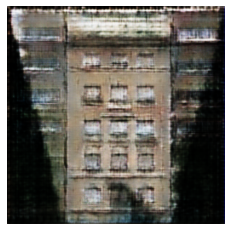

INFO:root:speed: 58.33848892845221 samples/s
INFO:root:discriminator loss = 0.380917, generator loss = 16.490650, binary training acc = 0.656041 at iter 0 epoch 57
INFO:root:speed: 24.99921920353993 samples/s
INFO:root:discriminator loss = 0.455225, generator loss = 16.992571, binary training acc = 0.720827 at iter 10 epoch 57
INFO:root:speed: 24.981530255002795 samples/s
INFO:root:discriminator loss = 0.349279, generator loss = 16.730259, binary training acc = 0.744661 at iter 20 epoch 57
INFO:root:speed: 25.63282328078802 samples/s
INFO:root:discriminator loss = 0.427749, generator loss = 16.837021, binary training acc = 0.746598 at iter 30 epoch 57
INFO:root:
binary training acc at epoch 57: facc=0.762833
INFO:root:time: 15.445956


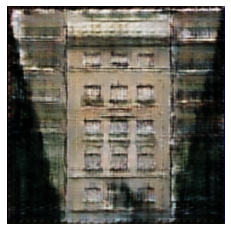

INFO:root:speed: 59.909043124528644 samples/s
INFO:root:discriminator loss = 0.514764, generator loss = 16.982937, binary training acc = 0.693714 at iter 0 epoch 58
INFO:root:speed: 25.83100333302951 samples/s
INFO:root:discriminator loss = 0.449403, generator loss = 16.951283, binary training acc = 0.709525 at iter 10 epoch 58
INFO:root:speed: 26.702862105056752 samples/s
INFO:root:discriminator loss = 0.484488, generator loss = 17.159353, binary training acc = 0.711475 at iter 20 epoch 58
INFO:root:speed: 25.752259606204408 samples/s
INFO:root:discriminator loss = 0.574749, generator loss = 16.794617, binary training acc = 0.729631 at iter 30 epoch 58
INFO:root:
binary training acc at epoch 58: facc=0.737132
INFO:root:time: 15.407502


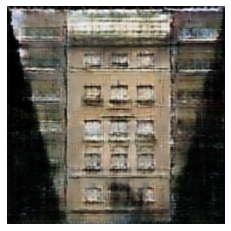

INFO:root:speed: 62.69784489910624 samples/s
INFO:root:discriminator loss = 0.502796, generator loss = 16.788670, binary training acc = 0.632980 at iter 0 epoch 59
INFO:root:speed: 25.514582832740732 samples/s
INFO:root:discriminator loss = 0.394683, generator loss = 16.572386, binary training acc = 0.837822 at iter 10 epoch 59
INFO:root:speed: 25.3112319653948 samples/s
INFO:root:discriminator loss = 0.630982, generator loss = 17.004938, binary training acc = 0.778919 at iter 20 epoch 59
INFO:root:speed: 26.408635514206992 samples/s
INFO:root:discriminator loss = 0.287530, generator loss = 15.693652, binary training acc = 0.785348 at iter 30 epoch 59
INFO:root:
binary training acc at epoch 59: facc=0.793742
INFO:root:time: 15.417744


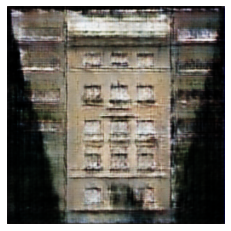

INFO:root:speed: 56.40264860765213 samples/s
INFO:root:discriminator loss = 0.773194, generator loss = 16.143021, binary training acc = 0.525837 at iter 0 epoch 60
INFO:root:speed: 25.732036886047975 samples/s
INFO:root:discriminator loss = 0.599226, generator loss = 17.467640, binary training acc = 0.666297 at iter 10 epoch 60
INFO:root:speed: 26.177457063718826 samples/s
INFO:root:discriminator loss = 0.488118, generator loss = 16.471157, binary training acc = 0.718987 at iter 20 epoch 60
INFO:root:speed: 25.220143144304203 samples/s
INFO:root:discriminator loss = 0.239398, generator loss = 15.255743, binary training acc = 0.744506 at iter 30 epoch 60
INFO:root:
binary training acc at epoch 60: facc=0.745617
INFO:root:time: 15.412141


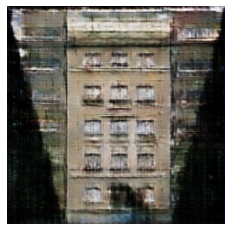

INFO:root:speed: 56.34014407739291 samples/s
INFO:root:discriminator loss = 0.631297, generator loss = 17.016867, binary training acc = 0.726980 at iter 0 epoch 61
INFO:root:speed: 25.17512369069134 samples/s
INFO:root:discriminator loss = 0.495011, generator loss = 16.840506, binary training acc = 0.763280 at iter 10 epoch 61
INFO:root:speed: 25.16615115996508 samples/s
INFO:root:discriminator loss = 0.452196, generator loss = 16.059587, binary training acc = 0.738525 at iter 20 epoch 61
INFO:root:speed: 24.499653910519076 samples/s
INFO:root:discriminator loss = 0.565963, generator loss = 16.239552, binary training acc = 0.738864 at iter 30 epoch 61
INFO:root:
binary training acc at epoch 61: facc=0.726086
INFO:root:time: 15.389252


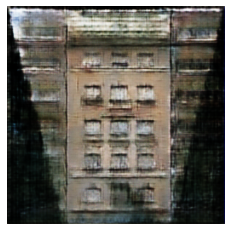

INFO:root:speed: 64.45061142202103 samples/s
INFO:root:discriminator loss = 0.466164, generator loss = 16.307232, binary training acc = 0.876122 at iter 0 epoch 62
INFO:root:speed: 25.72345184439237 samples/s
INFO:root:discriminator loss = 0.485825, generator loss = 17.066786, binary training acc = 0.810612 at iter 10 epoch 62
INFO:root:speed: 25.381244776919626 samples/s
INFO:root:discriminator loss = 0.700180, generator loss = 17.267128, binary training acc = 0.779514 at iter 20 epoch 62
INFO:root:speed: 26.166841765091945 samples/s
INFO:root:discriminator loss = 0.327437, generator loss = 15.413290, binary training acc = 0.775854 at iter 30 epoch 62
INFO:root:
binary training acc at epoch 62: facc=0.776878
INFO:root:time: 15.406368


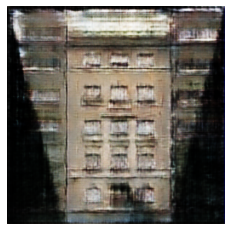

INFO:root:speed: 61.80628067802205 samples/s
INFO:root:discriminator loss = 0.638887, generator loss = 17.023632, binary training acc = 0.541143 at iter 0 epoch 63
INFO:root:speed: 25.84147521086323 samples/s
INFO:root:discriminator loss = 0.367305, generator loss = 16.206450, binary training acc = 0.756553 at iter 10 epoch 63
INFO:root:speed: 26.168751883433337 samples/s
INFO:root:discriminator loss = 0.459399, generator loss = 16.251629, binary training acc = 0.762175 at iter 20 epoch 63
INFO:root:speed: 25.501458901182016 samples/s
INFO:root:discriminator loss = 0.498388, generator loss = 16.090008, binary training acc = 0.749049 at iter 30 epoch 63
INFO:root:
binary training acc at epoch 63: facc=0.768032
INFO:root:time: 15.400927


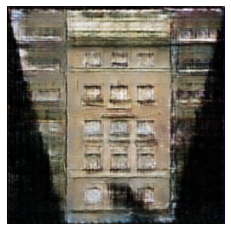

INFO:root:speed: 59.636632494916896 samples/s
INFO:root:discriminator loss = 0.496241, generator loss = 15.744272, binary training acc = 0.538694 at iter 0 epoch 64
INFO:root:speed: 25.825913693269 samples/s
INFO:root:discriminator loss = 0.429963, generator loss = 16.204165, binary training acc = 0.651941 at iter 10 epoch 64
INFO:root:speed: 26.08349346716168 samples/s
INFO:root:discriminator loss = 0.530590, generator loss = 16.314381, binary training acc = 0.706894 at iter 20 epoch 64
INFO:root:speed: 25.40821327298159 samples/s
INFO:root:discriminator loss = 0.573265, generator loss = 15.698492, binary training acc = 0.718972 at iter 30 epoch 64
INFO:root:
binary training acc at epoch 64: facc=0.731109
INFO:root:time: 15.397506


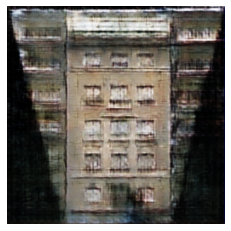

INFO:root:speed: 59.03354703411002 samples/s
INFO:root:discriminator loss = 0.418900, generator loss = 16.271042, binary training acc = 0.877306 at iter 0 epoch 65
INFO:root:speed: 25.631194214638665 samples/s
INFO:root:discriminator loss = 0.480274, generator loss = 16.952335, binary training acc = 0.734093 at iter 10 epoch 65
INFO:root:speed: 24.87658395831665 samples/s
INFO:root:discriminator loss = 0.515893, generator loss = 16.149796, binary training acc = 0.746814 at iter 20 epoch 65
INFO:root:speed: 25.47084243229522 samples/s
INFO:root:discriminator loss = 0.379464, generator loss = 15.554239, binary training acc = 0.769323 at iter 30 epoch 65
INFO:root:
binary training acc at epoch 65: facc=0.779961
INFO:root:time: 15.385714


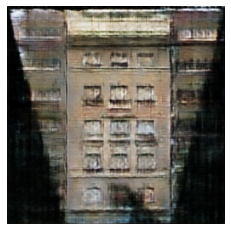

INFO:root:speed: 57.956070437637486 samples/s
INFO:root:discriminator loss = 0.541560, generator loss = 16.128536, binary training acc = 0.608082 at iter 0 epoch 66
INFO:root:speed: 25.450209733605252 samples/s
INFO:root:discriminator loss = 0.483453, generator loss = 16.701811, binary training acc = 0.805492 at iter 10 epoch 66
INFO:root:speed: 26.051351106263674 samples/s
INFO:root:discriminator loss = 0.575823, generator loss = 16.215519, binary training acc = 0.761160 at iter 20 epoch 66
INFO:root:speed: 25.0961921053844 samples/s
INFO:root:discriminator loss = 0.451117, generator loss = 16.369274, binary training acc = 0.771724 at iter 30 epoch 66
INFO:root:
binary training acc at epoch 66: facc=0.762531
INFO:root:time: 15.374297


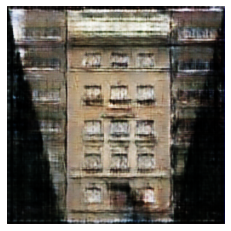

INFO:root:speed: 58.984731740176606 samples/s
INFO:root:discriminator loss = 0.619555, generator loss = 15.813975, binary training acc = 0.549224 at iter 0 epoch 67
INFO:root:speed: 25.060250178049913 samples/s
INFO:root:discriminator loss = 0.301148, generator loss = 15.822637, binary training acc = 0.748315 at iter 10 epoch 67
INFO:root:speed: 25.85509497699162 samples/s
INFO:root:discriminator loss = 0.588261, generator loss = 16.090889, binary training acc = 0.740836 at iter 20 epoch 67
INFO:root:speed: 25.46059145147025 samples/s
INFO:root:discriminator loss = 0.546135, generator loss = 15.578852, binary training acc = 0.730366 at iter 30 epoch 67
INFO:root:
binary training acc at epoch 67: facc=0.711494
INFO:root:time: 15.362583


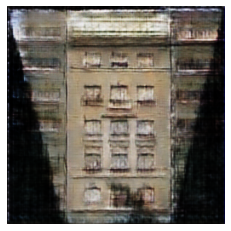

INFO:root:speed: 60.27225449889566 samples/s
INFO:root:discriminator loss = 1.038966, generator loss = 16.766638, binary training acc = 0.570327 at iter 0 epoch 68
INFO:root:speed: 26.750564916440837 samples/s
INFO:root:discriminator loss = 0.969167, generator loss = 16.463577, binary training acc = 0.589740 at iter 10 epoch 68
INFO:root:speed: 25.276652008396013 samples/s
INFO:root:discriminator loss = 0.804496, generator loss = 16.074677, binary training acc = 0.621211 at iter 20 epoch 68
INFO:root:speed: 26.143241364909887 samples/s
INFO:root:discriminator loss = 0.400884, generator loss = 15.691376, binary training acc = 0.693352 at iter 30 epoch 68
INFO:root:
binary training acc at epoch 68: facc=0.725479
INFO:root:time: 15.367838


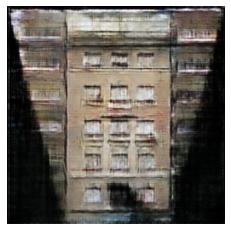

INFO:root:speed: 61.432590893578755 samples/s
INFO:root:discriminator loss = 0.652588, generator loss = 15.911267, binary training acc = 0.688082 at iter 0 epoch 69
INFO:root:speed: 24.9798490240162 samples/s
INFO:root:discriminator loss = 0.292668, generator loss = 15.642443, binary training acc = 0.739032 at iter 10 epoch 69
INFO:root:speed: 26.311819511742225 samples/s
INFO:root:discriminator loss = 0.392088, generator loss = 15.455612, binary training acc = 0.760016 at iter 20 epoch 69
INFO:root:speed: 25.415280056813636 samples/s
INFO:root:discriminator loss = 0.275842, generator loss = 14.729396, binary training acc = 0.777318 at iter 30 epoch 69
INFO:root:
binary training acc at epoch 69: facc=0.778610
INFO:root:time: 15.334475


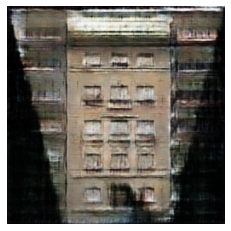

INFO:root:speed: 63.07821643253421 samples/s
INFO:root:discriminator loss = 0.367617, generator loss = 15.441998, binary training acc = 0.953918 at iter 0 epoch 70
INFO:root:speed: 25.56850753893215 samples/s
INFO:root:discriminator loss = 0.544661, generator loss = 16.301733, binary training acc = 0.741273 at iter 10 epoch 70
INFO:root:speed: 26.17887853418892 samples/s
INFO:root:discriminator loss = 0.464878, generator loss = 15.867895, binary training acc = 0.771390 at iter 20 epoch 70
INFO:root:speed: 25.90243751814089 samples/s
INFO:root:discriminator loss = 0.479246, generator loss = 15.303152, binary training acc = 0.751496 at iter 30 epoch 70
INFO:root:
binary training acc at epoch 70: facc=0.749235
INFO:root:time: 15.332680


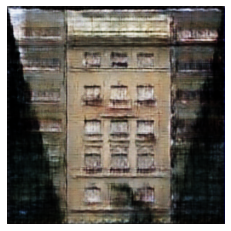

INFO:root:speed: 58.69270564397072 samples/s
INFO:root:discriminator loss = 0.541888, generator loss = 15.392328, binary training acc = 0.681878 at iter 0 epoch 71
INFO:root:speed: 25.92515627211653 samples/s
INFO:root:discriminator loss = 0.424121, generator loss = 15.329718, binary training acc = 0.737406 at iter 10 epoch 71
INFO:root:speed: 25.822399831557068 samples/s
INFO:root:discriminator loss = 0.528396, generator loss = 15.325025, binary training acc = 0.715308 at iter 20 epoch 71
INFO:root:speed: 26.296378961412202 samples/s
INFO:root:discriminator loss = 0.827631, generator loss = 16.218887, binary training acc = 0.727120 at iter 30 epoch 71
INFO:root:
binary training acc at epoch 71: facc=0.728276
INFO:root:time: 15.342423


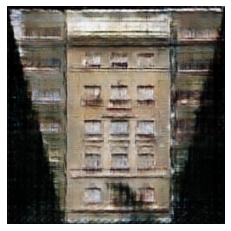

INFO:root:speed: 55.61358124709124 samples/s
INFO:root:discriminator loss = 0.447407, generator loss = 15.258555, binary training acc = 0.745959 at iter 0 epoch 72
INFO:root:speed: 25.730521462325065 samples/s
INFO:root:discriminator loss = 0.453401, generator loss = 15.982572, binary training acc = 0.804635 at iter 10 epoch 72
INFO:root:speed: 25.566652870371104 samples/s
INFO:root:discriminator loss = 0.471399, generator loss = 15.205778, binary training acc = 0.739778 at iter 20 epoch 72
INFO:root:speed: 26.15246768745764 samples/s
INFO:root:discriminator loss = 0.277229, generator loss = 14.564853, binary training acc = 0.780241 at iter 30 epoch 72
INFO:root:
binary training acc at epoch 72: facc=0.783296
INFO:root:time: 15.369519


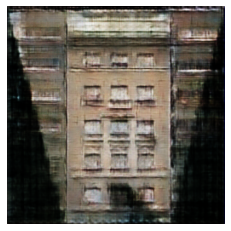

INFO:root:speed: 61.04855002008605 samples/s
INFO:root:discriminator loss = 0.557210, generator loss = 15.131075, binary training acc = 0.527306 at iter 0 epoch 73
INFO:root:speed: 26.018787503202486 samples/s
INFO:root:discriminator loss = 0.370371, generator loss = 15.417955, binary training acc = 0.787818 at iter 10 epoch 73
INFO:root:speed: 25.831639679055595 samples/s
INFO:root:discriminator loss = 0.460567, generator loss = 15.205444, binary training acc = 0.757335 at iter 20 epoch 73
INFO:root:speed: 25.48902999818296 samples/s
INFO:root:discriminator loss = 1.219034, generator loss = 17.010241, binary training acc = 0.756486 at iter 30 epoch 73
INFO:root:
binary training acc at epoch 73: facc=0.739048
INFO:root:time: 15.401437


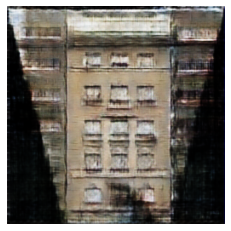

INFO:root:speed: 58.00135243708333 samples/s
INFO:root:discriminator loss = 0.375530, generator loss = 14.710385, binary training acc = 0.681551 at iter 0 epoch 74
INFO:root:speed: 25.3355723346421 samples/s
INFO:root:discriminator loss = 0.484768, generator loss = 16.085871, binary training acc = 0.751629 at iter 10 epoch 74
INFO:root:speed: 25.892811283854527 samples/s
INFO:root:discriminator loss = 0.428312, generator loss = 14.988248, binary training acc = 0.767992 at iter 20 epoch 74
INFO:root:speed: 25.008699343763006 samples/s
INFO:root:discriminator loss = 0.371653, generator loss = 14.749800, binary training acc = 0.774969 at iter 30 epoch 74
INFO:root:
binary training acc at epoch 74: facc=0.775462
INFO:root:time: 15.425874


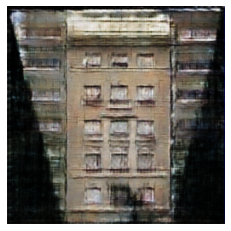

INFO:root:speed: 59.049421092940484 samples/s
INFO:root:discriminator loss = 0.674784, generator loss = 15.563606, binary training acc = 0.557837 at iter 0 epoch 75
INFO:root:speed: 26.16099886107483 samples/s
INFO:root:discriminator loss = 0.530490, generator loss = 16.026981, binary training acc = 0.755236 at iter 10 epoch 75
INFO:root:speed: 25.514738042734393 samples/s
INFO:root:discriminator loss = 0.301531, generator loss = 14.464834, binary training acc = 0.755316 at iter 20 epoch 75
INFO:root:speed: 25.942426090473994 samples/s
INFO:root:discriminator loss = 0.512889, generator loss = 15.473166, binary training acc = 0.781018 at iter 30 epoch 75
INFO:root:
binary training acc at epoch 75: facc=0.763361
INFO:root:time: 15.404236


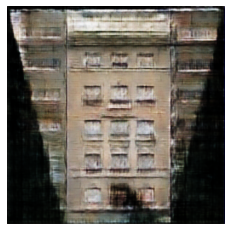

INFO:root:speed: 65.49353153814323 samples/s
INFO:root:discriminator loss = 0.475320, generator loss = 15.345556, binary training acc = 0.699796 at iter 0 epoch 76
INFO:root:speed: 25.456774567891344 samples/s
INFO:root:discriminator loss = 0.415089, generator loss = 15.440340, binary training acc = 0.731970 at iter 10 epoch 76
INFO:root:speed: 25.86510788372275 samples/s
INFO:root:discriminator loss = 0.405161, generator loss = 14.690956, binary training acc = 0.692500 at iter 20 epoch 76
INFO:root:speed: 25.659497332988295 samples/s
INFO:root:discriminator loss = 1.400392, generator loss = 15.890065, binary training acc = 0.700261 at iter 30 epoch 76
INFO:root:
binary training acc at epoch 76: facc=0.716216
INFO:root:time: 15.386222


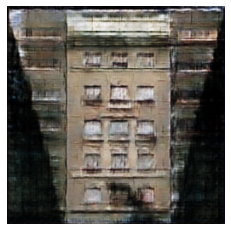

INFO:root:speed: 59.96214395589942 samples/s
INFO:root:discriminator loss = 0.352076, generator loss = 15.432249, binary training acc = 0.728367 at iter 0 epoch 77
INFO:root:speed: 25.013889634360893 samples/s
INFO:root:discriminator loss = 0.224153, generator loss = 14.901713, binary training acc = 0.864234 at iter 10 epoch 77
INFO:root:speed: 25.639733449235603 samples/s
INFO:root:discriminator loss = 0.551250, generator loss = 14.929568, binary training acc = 0.802696 at iter 20 epoch 77
INFO:root:speed: 26.195555572210242 samples/s
INFO:root:discriminator loss = 0.861387, generator loss = 15.511266, binary training acc = 0.771976 at iter 30 epoch 77
INFO:root:
binary training acc at epoch 77: facc=0.753815
INFO:root:time: 15.376133


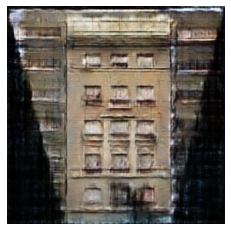

INFO:root:speed: 57.11112714815001 samples/s
INFO:root:discriminator loss = 0.411246, generator loss = 15.267980, binary training acc = 0.617796 at iter 0 epoch 78
INFO:root:speed: 26.32668330429281 samples/s
INFO:root:discriminator loss = 0.576545, generator loss = 15.943621, binary training acc = 0.764508 at iter 10 epoch 78
INFO:root:speed: 26.241231659371707 samples/s
INFO:root:discriminator loss = 0.679077, generator loss = 14.932803, binary training acc = 0.743942 at iter 20 epoch 78
INFO:root:speed: 25.724067125503986 samples/s
INFO:root:discriminator loss = 0.337011, generator loss = 14.283229, binary training acc = 0.758978 at iter 30 epoch 78
INFO:root:
binary training acc at epoch 78: facc=0.762410
INFO:root:time: 15.355556


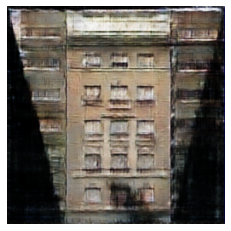

INFO:root:speed: 60.797411731281585 samples/s
INFO:root:discriminator loss = 0.401354, generator loss = 15.123004, binary training acc = 0.872204 at iter 0 epoch 79
INFO:root:speed: 25.080480142172217 samples/s
INFO:root:discriminator loss = 0.654166, generator loss = 16.228716, binary training acc = 0.795113 at iter 10 epoch 79
INFO:root:speed: 25.46898643938529 samples/s
INFO:root:discriminator loss = 0.457124, generator loss = 14.541880, binary training acc = 0.743642 at iter 20 epoch 79
INFO:root:speed: 25.509555050483243 samples/s
INFO:root:discriminator loss = 0.371511, generator loss = 14.644289, binary training acc = 0.747448 at iter 30 epoch 79
INFO:root:
binary training acc at epoch 79: facc=0.743282
INFO:root:time: 15.323791


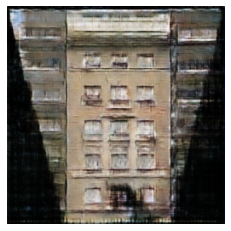

INFO:root:speed: 60.067166092150735 samples/s
INFO:root:discriminator loss = 0.502716, generator loss = 15.168930, binary training acc = 0.711918 at iter 0 epoch 80
INFO:root:speed: 25.744214109556587 samples/s
INFO:root:discriminator loss = 0.270351, generator loss = 14.278310, binary training acc = 0.781596 at iter 10 epoch 80
INFO:root:speed: 25.715235141852713 samples/s
INFO:root:discriminator loss = 0.510845, generator loss = 14.535769, binary training acc = 0.755913 at iter 20 epoch 80
INFO:root:speed: 24.48708128607992 samples/s
INFO:root:discriminator loss = 0.366320, generator loss = 14.586706, binary training acc = 0.742213 at iter 30 epoch 80
INFO:root:
binary training acc at epoch 80: facc=0.752397
INFO:root:time: 15.384325


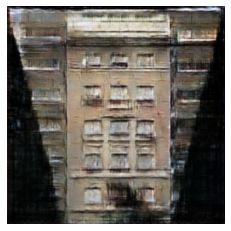

INFO:root:speed: 59.562614316712676 samples/s
INFO:root:discriminator loss = 0.374961, generator loss = 14.887158, binary training acc = 0.960980 at iter 0 epoch 81
INFO:root:speed: 25.305871755469116 samples/s
INFO:root:discriminator loss = 0.323014, generator loss = 15.147684, binary training acc = 0.801291 at iter 10 epoch 81
INFO:root:speed: 25.660611919022593 samples/s
INFO:root:discriminator loss = 1.067433, generator loss = 15.872726, binary training acc = 0.737668 at iter 20 epoch 81
INFO:root:speed: 26.04211513207934 samples/s
INFO:root:discriminator loss = 0.584702, generator loss = 15.111300, binary training acc = 0.744282 at iter 30 epoch 81
INFO:root:
binary training acc at epoch 81: facc=0.748427
INFO:root:time: 15.395066


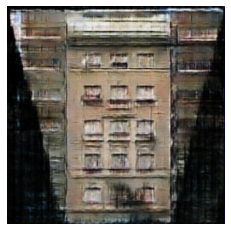

INFO:root:speed: 61.689378106123335 samples/s
INFO:root:discriminator loss = 0.311692, generator loss = 14.467402, binary training acc = 0.800571 at iter 0 epoch 82
INFO:root:speed: 25.45050314801241 samples/s
INFO:root:discriminator loss = 0.396205, generator loss = 15.093837, binary training acc = 0.778045 at iter 10 epoch 82
INFO:root:speed: 25.7471535312909 samples/s
INFO:root:discriminator loss = 0.474678, generator loss = 14.453631, binary training acc = 0.765279 at iter 20 epoch 82
INFO:root:speed: 25.74411930067492 samples/s
INFO:root:discriminator loss = 0.535395, generator loss = 15.439148, binary training acc = 0.769088 at iter 30 epoch 82
INFO:root:
binary training acc at epoch 82: facc=0.748160
INFO:root:time: 15.391389


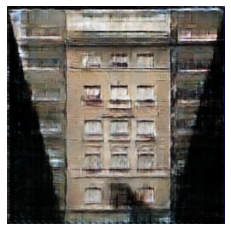

INFO:root:speed: 58.577701306101474 samples/s
INFO:root:discriminator loss = 0.735175, generator loss = 15.103851, binary training acc = 0.636939 at iter 0 epoch 83
INFO:root:speed: 25.877858450846738 samples/s
INFO:root:discriminator loss = 0.268581, generator loss = 14.483411, binary training acc = 0.755636 at iter 10 epoch 83
INFO:root:speed: 25.530392904599093 samples/s
INFO:root:discriminator loss = 0.654896, generator loss = 14.363405, binary training acc = 0.718566 at iter 20 epoch 83
INFO:root:speed: 25.102650669325577 samples/s
INFO:root:discriminator loss = 0.429780, generator loss = 13.900444, binary training acc = 0.727227 at iter 30 epoch 83
INFO:root:
binary training acc at epoch 83: facc=0.742705
INFO:root:time: 15.331623


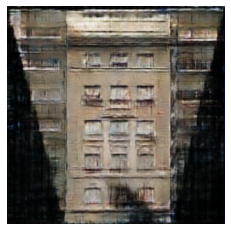

INFO:root:speed: 60.148740467101284 samples/s
INFO:root:discriminator loss = 0.515489, generator loss = 14.410762, binary training acc = 0.720653 at iter 0 epoch 84
INFO:root:speed: 25.70491256734487 samples/s
INFO:root:discriminator loss = 0.464949, generator loss = 14.300148, binary training acc = 0.727202 at iter 10 epoch 84
INFO:root:speed: 25.864134952407028 samples/s
INFO:root:discriminator loss = 0.512163, generator loss = 14.572072, binary training acc = 0.722437 at iter 20 epoch 84
INFO:root:speed: 25.702471033196314 samples/s
INFO:root:discriminator loss = 0.689990, generator loss = 15.166731, binary training acc = 0.727754 at iter 30 epoch 84
INFO:root:
binary training acc at epoch 84: facc=0.743233
INFO:root:time: 15.325701


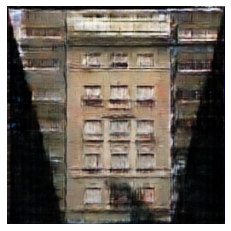

INFO:root:speed: 60.879745815728015 samples/s
INFO:root:discriminator loss = 0.403843, generator loss = 14.288994, binary training acc = 0.714367 at iter 0 epoch 85
INFO:root:speed: 26.30657165042016 samples/s
INFO:root:discriminator loss = 0.293379, generator loss = 14.618828, binary training acc = 0.761206 at iter 10 epoch 85
INFO:root:speed: 25.355758918909768 samples/s
INFO:root:discriminator loss = 0.456679, generator loss = 14.399313, binary training acc = 0.762649 at iter 20 epoch 85
INFO:root:speed: 25.744988408229204 samples/s
INFO:root:discriminator loss = 0.459443, generator loss = 13.874987, binary training acc = 0.739402 at iter 30 epoch 85
INFO:root:
binary training acc at epoch 85: facc=0.724541
INFO:root:time: 15.357662


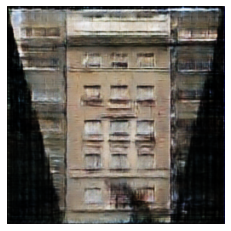

INFO:root:speed: 57.913257916240354 samples/s
INFO:root:discriminator loss = 1.583466, generator loss = 14.382670, binary training acc = 0.538245 at iter 0 epoch 86
INFO:root:speed: 25.389879530908456 samples/s
INFO:root:discriminator loss = 0.583397, generator loss = 14.372894, binary training acc = 0.618256 at iter 10 epoch 86
INFO:root:speed: 26.00931653908928 samples/s
INFO:root:discriminator loss = 0.518592, generator loss = 14.645526, binary training acc = 0.665885 at iter 20 epoch 86
INFO:root:speed: 25.587287565869985 samples/s
INFO:root:discriminator loss = 0.590650, generator loss = 14.628418, binary training acc = 0.712228 at iter 30 epoch 86
INFO:root:
binary training acc at epoch 86: facc=0.719661
INFO:root:time: 15.388800


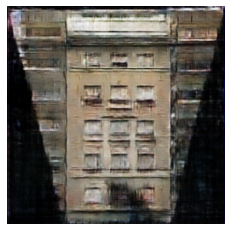

INFO:root:speed: 57.80152389824693 samples/s
INFO:root:discriminator loss = 0.663894, generator loss = 14.075029, binary training acc = 0.518327 at iter 0 epoch 87
INFO:root:speed: 25.815581534764803 samples/s
INFO:root:discriminator loss = 0.322191, generator loss = 14.190115, binary training acc = 0.738516 at iter 10 epoch 87
INFO:root:speed: 25.81014854836129 samples/s
INFO:root:discriminator loss = 0.341866, generator loss = 13.669370, binary training acc = 0.749407 at iter 20 epoch 87
INFO:root:speed: 25.465862795456065 samples/s
INFO:root:discriminator loss = 0.363034, generator loss = 13.077560, binary training acc = 0.758154 at iter 30 epoch 87
INFO:root:
binary training acc at epoch 87: facc=0.759623
INFO:root:time: 15.429523


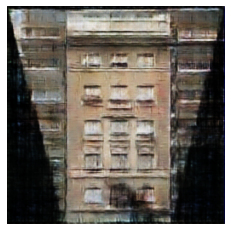

INFO:root:speed: 65.0583295460362 samples/s
INFO:root:discriminator loss = 0.701365, generator loss = 15.059515, binary training acc = 0.579265 at iter 0 epoch 88
INFO:root:speed: 26.206325176055127 samples/s
INFO:root:discriminator loss = 0.363556, generator loss = 13.666852, binary training acc = 0.700965 at iter 10 epoch 88
INFO:root:speed: 25.60492282146531 samples/s
INFO:root:discriminator loss = 0.568304, generator loss = 14.537827, binary training acc = 0.712327 at iter 20 epoch 88
INFO:root:speed: 25.879215634010254 samples/s
INFO:root:discriminator loss = 0.309066, generator loss = 13.856720, binary training acc = 0.729529 at iter 30 epoch 88
INFO:root:
binary training acc at epoch 88: facc=0.731493
INFO:root:time: 15.460227


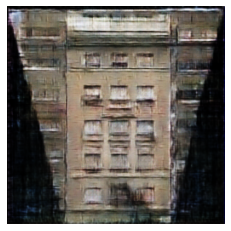

INFO:root:speed: 62.14032264994304 samples/s
INFO:root:discriminator loss = 0.344909, generator loss = 13.597290, binary training acc = 0.813959 at iter 0 epoch 89
INFO:root:speed: 25.8286014093241 samples/s
INFO:root:discriminator loss = 0.434028, generator loss = 14.253952, binary training acc = 0.677391 at iter 10 epoch 89
INFO:root:speed: 25.622206746569905 samples/s
INFO:root:discriminator loss = 0.745309, generator loss = 15.118297, binary training acc = 0.686344 at iter 20 epoch 89
INFO:root:speed: 25.699415831016225 samples/s
INFO:root:discriminator loss = 0.690544, generator loss = 14.972041, binary training acc = 0.696133 at iter 30 epoch 89
INFO:root:
binary training acc at epoch 89: facc=0.717165
INFO:root:time: 15.435141


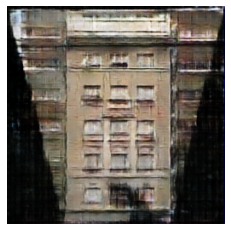

INFO:root:speed: 55.857099290317336 samples/s
INFO:root:discriminator loss = 0.612376, generator loss = 14.003653, binary training acc = 0.506163 at iter 0 epoch 90
INFO:root:speed: 25.748576073117217 samples/s
INFO:root:discriminator loss = 0.452224, generator loss = 14.373525, binary training acc = 0.775321 at iter 10 epoch 90
INFO:root:speed: 26.112886155072157 samples/s
INFO:root:discriminator loss = 0.534749, generator loss = 14.721960, binary training acc = 0.786509 at iter 20 epoch 90
INFO:root:speed: 25.441564767260523 samples/s
INFO:root:discriminator loss = 0.718226, generator loss = 14.717883, binary training acc = 0.780787 at iter 30 epoch 90
INFO:root:
binary training acc at epoch 90: facc=0.761548
INFO:root:time: 15.407544


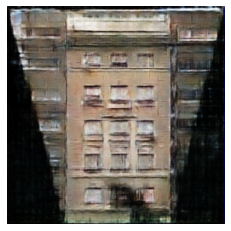

INFO:root:speed: 56.134219852460944 samples/s
INFO:root:discriminator loss = 0.697905, generator loss = 14.428744, binary training acc = 0.507265 at iter 0 epoch 91
INFO:root:speed: 25.636771492313805 samples/s
INFO:root:discriminator loss = 0.280288, generator loss = 14.105367, binary training acc = 0.782282 at iter 10 epoch 91
INFO:root:speed: 25.330874914769655 samples/s
INFO:root:discriminator loss = 0.549358, generator loss = 14.391554, binary training acc = 0.781114 at iter 20 epoch 91
INFO:root:speed: 25.316426357113194 samples/s
INFO:root:discriminator loss = 0.531042, generator loss = 14.136803, binary training acc = 0.770270 at iter 30 epoch 91
INFO:root:
binary training acc at epoch 91: facc=0.755685
INFO:root:time: 15.401395


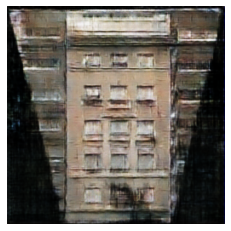

INFO:root:speed: 60.837094883904435 samples/s
INFO:root:discriminator loss = 0.423219, generator loss = 14.668958, binary training acc = 0.702367 at iter 0 epoch 92
INFO:root:speed: 25.9760373869282 samples/s
INFO:root:discriminator loss = 0.557802, generator loss = 14.689473, binary training acc = 0.749666 at iter 10 epoch 92
INFO:root:speed: 25.795322737968284 samples/s
INFO:root:discriminator loss = 0.386630, generator loss = 13.787596, binary training acc = 0.732826 at iter 20 epoch 92
INFO:root:speed: 26.25318908687586 samples/s
INFO:root:discriminator loss = 0.441983, generator loss = 13.966418, binary training acc = 0.756851 at iter 30 epoch 92
INFO:root:
binary training acc at epoch 92: facc=0.746894
INFO:root:time: 15.380207


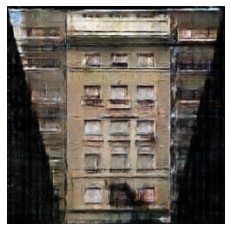

INFO:root:speed: 64.23848301571232 samples/s
INFO:root:discriminator loss = 0.346970, generator loss = 14.115616, binary training acc = 0.741347 at iter 0 epoch 93
INFO:root:speed: 25.123987535955127 samples/s
INFO:root:discriminator loss = 0.502048, generator loss = 14.182663, binary training acc = 0.716857 at iter 10 epoch 93
INFO:root:speed: 25.35088546388637 samples/s
INFO:root:discriminator loss = 0.543453, generator loss = 14.000120, binary training acc = 0.697506 at iter 20 epoch 93
INFO:root:speed: 25.653502207668215 samples/s
INFO:root:discriminator loss = 0.425032, generator loss = 13.334849, binary training acc = 0.720718 at iter 30 epoch 93
INFO:root:
binary training acc at epoch 93: facc=0.731276
INFO:root:time: 15.373515


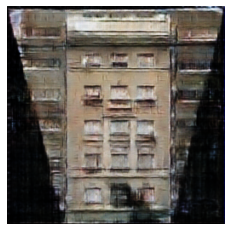

INFO:root:speed: 60.38088739363211 samples/s
INFO:root:discriminator loss = 0.332513, generator loss = 13.735148, binary training acc = 0.745918 at iter 0 epoch 94
INFO:root:speed: 25.422551089926515 samples/s
INFO:root:discriminator loss = 0.504545, generator loss = 13.924738, binary training acc = 0.726271 at iter 10 epoch 94
INFO:root:speed: 25.609065709296505 samples/s
INFO:root:discriminator loss = 0.583956, generator loss = 13.959063, binary training acc = 0.693751 at iter 20 epoch 94
INFO:root:speed: 26.032594865607315 samples/s
INFO:root:discriminator loss = 0.519245, generator loss = 14.110689, binary training acc = 0.718818 at iter 30 epoch 94
INFO:root:
binary training acc at epoch 94: facc=0.744863
INFO:root:time: 15.385778


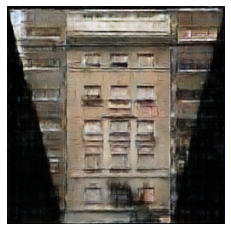

INFO:root:speed: 57.25426065590554 samples/s
INFO:root:discriminator loss = 0.498707, generator loss = 13.770688, binary training acc = 0.563837 at iter 0 epoch 95
INFO:root:speed: 25.228562388948838 samples/s
INFO:root:discriminator loss = 0.437676, generator loss = 13.992220, binary training acc = 0.731180 at iter 10 epoch 95
INFO:root:speed: 25.73331566366773 samples/s
INFO:root:discriminator loss = 0.593640, generator loss = 13.864177, binary training acc = 0.686822 at iter 20 epoch 95
INFO:root:speed: 25.290018221482054 samples/s
INFO:root:discriminator loss = 0.690412, generator loss = 14.774370, binary training acc = 0.706456 at iter 30 epoch 95
INFO:root:
binary training acc at epoch 95: facc=0.727369
INFO:root:time: 15.386227


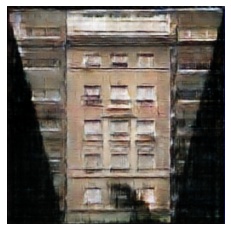

INFO:root:speed: 62.66449732343085 samples/s
INFO:root:discriminator loss = 0.487062, generator loss = 13.907608, binary training acc = 0.607061 at iter 0 epoch 96
INFO:root:speed: 26.605703382498092 samples/s
INFO:root:discriminator loss = 0.412001, generator loss = 14.100406, binary training acc = 0.745202 at iter 10 epoch 96
INFO:root:speed: 25.373444749003195 samples/s
INFO:root:discriminator loss = 0.547600, generator loss = 13.836914, binary training acc = 0.733953 at iter 20 epoch 96
INFO:root:speed: 25.659371751899076 samples/s
INFO:root:discriminator loss = 0.402950, generator loss = 13.553441, binary training acc = 0.739993 at iter 30 epoch 96
INFO:root:
binary training acc at epoch 96: facc=0.739400
INFO:root:time: 15.349277


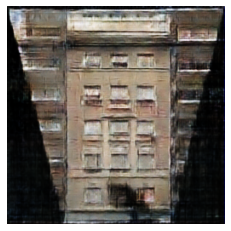

INFO:root:speed: 61.84464759657918 samples/s
INFO:root:discriminator loss = 0.628207, generator loss = 14.540968, binary training acc = 0.623061 at iter 0 epoch 97
INFO:root:speed: 25.474679008296587 samples/s
INFO:root:discriminator loss = 0.486019, generator loss = 15.404726, binary training acc = 0.711885 at iter 10 epoch 97
INFO:root:speed: 26.118707585085144 samples/s
INFO:root:discriminator loss = 0.587208, generator loss = 13.547216, binary training acc = 0.745784 at iter 20 epoch 97
INFO:root:speed: 25.08469507917493 samples/s
INFO:root:discriminator loss = 0.396493, generator loss = 13.226352, binary training acc = 0.742067 at iter 30 epoch 97
INFO:root:
binary training acc at epoch 97: facc=0.733604
INFO:root:time: 15.358056


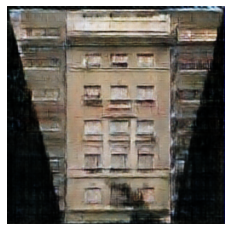

INFO:root:speed: 57.31771445438693 samples/s
INFO:root:discriminator loss = 0.673904, generator loss = 13.971933, binary training acc = 0.511510 at iter 0 epoch 98
INFO:root:speed: 26.20077559668972 samples/s
INFO:root:discriminator loss = 0.411431, generator loss = 14.718333, binary training acc = 0.792338 at iter 10 epoch 98
INFO:root:speed: 26.39974269354789 samples/s
INFO:root:discriminator loss = 0.519822, generator loss = 13.509995, binary training acc = 0.718155 at iter 20 epoch 98
INFO:root:speed: 26.26153946333669 samples/s
INFO:root:discriminator loss = 0.650826, generator loss = 14.279955, binary training acc = 0.709092 at iter 30 epoch 98
INFO:root:
binary training acc at epoch 98: facc=0.720678
INFO:root:time: 15.349237


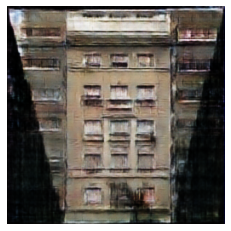

INFO:root:speed: 58.62436998045996 samples/s
INFO:root:discriminator loss = 0.655065, generator loss = 14.108479, binary training acc = 0.525347 at iter 0 epoch 99
INFO:root:speed: 25.761037933664916 samples/s
INFO:root:discriminator loss = 0.340421, generator loss = 13.963676, binary training acc = 0.766831 at iter 10 epoch 99
INFO:root:speed: 26.306687146847032 samples/s
INFO:root:discriminator loss = 0.397410, generator loss = 13.418600, binary training acc = 0.750562 at iter 20 epoch 99
INFO:root:speed: 25.76675101379349 samples/s
INFO:root:discriminator loss = 0.448145, generator loss = 13.251684, binary training acc = 0.758629 at iter 30 epoch 99
INFO:root:
binary training acc at epoch 99: facc=0.765367
INFO:root:time: 15.316742


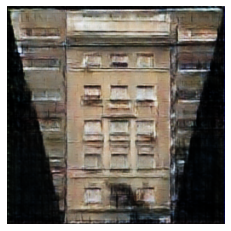

In [25]:
train()

In [26]:
def print_result():
    num_image = 4
    img_in_list, img_out_list = val_data.next().data
    for i in range(num_image):
        img_in = nd.expand_dims(img_in_list[i], axis=0)
        plt.subplot(2,4,i+1)
        visualize(img_in[0])
        img_out = netG(img_in.as_in_context(ctx))
        plt.subplot(2,4,i+5)
        visualize(img_out[0])
    plt.show()

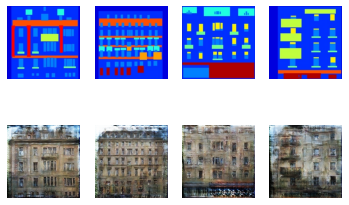

In [27]:
print_result()